# DiffNet


Model Ref: 
https://arxiv.org/pdf/2108.13993v1.pdf


Database: STL-10


## Packages & Dataset

In [ ]:
import IPython
import numpy as np
import torch
import random
from torch.utils.data import Dataset, DataLoader
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.nn import Module
from torchvision import transforms
from torchvision.datasets import STL10
from torch.autograd import Variable
import cv2
import os
import torchvision
import PIL
import matplotlib.pyplot as plt
from PIL import Image
import torchvision.transforms.functional as TF
from torchvision.utils import make_grid, save_image
from skimage.util import random_noise
from skimage.metrics import peak_signal_noise_ratio, structural_similarity
import argparse
import shutil
%matplotlib inline

In [ ]:
! pip3 install --upgrade pip
! pip3 install livelossplot
from livelossplot import PlotLosses

     |████████████████████████████████| 2.1 MB 8.2 MB/s 
  Attempting uninstall: pip
    Found existing installation: pip 21.1.3
    Uninstalling pip-21.1.3:
      Successfully uninstalled pip-21.1.3
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 793.9/793.9 KB 17.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 381.5/381.5 KB 33.8 MB/s eta 0:00:00
  Attempting uninstall: prompt-toolkit
    Found existing installation: prompt-toolkit 1.0.18
    Uninstalling prompt-toolkit-1.0.18:
      Successfully uninstalled prompt-toolkit-1.0.18
  Attempting uninstall: ipython
    Found existing installation: ipython 5.5.0
    Uninstalling ipython-5.5.0:
      Successfully uninstalled ipython-5.5.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
jupyter-console 5.2.0 requires prompt-toolkit<2.0.0,>=1.0.0, but you have prompt-toolkit 3.0.29 which is incompatible.
g

In [ ]:
np.random.seed(42)
torch.manual_seed(42)
random.seed(42)

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Using device:', device)

Using device: cuda


In [ ]:
os.makedirs('models', exist_ok=True)

os.makedirs('data', exist_ok=True)

os.makedirs('results', exist_ok=True)

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
!unzip './gdrive/MyDrive/data.zip' -d './data'

Archive:  ./gdrive/MyDrive/data.zip
   creating: ./data/test/
  inflating: ./data/__MACOSX/._test  
  inflating: ./data/test/test_239.png  
  inflating: ./data/__MACOSX/test/._test_239.png  
  inflating: ./data/test/test_205.png  
  inflating: ./data/__MACOSX/test/._test_205.png  
  inflating: ./data/test/test_211.png  
  inflating: ./data/__MACOSX/test/._test_211.png  
  inflating: ./data/test/test_173.png  
  inflating: ./data/__MACOSX/test/._test_173.png  
  inflating: ./data/test/test_167.png  
  inflating: ./data/__MACOSX/test/._test_167.png  
  inflating: ./data/test/test_14.png  
  inflating: ./data/__MACOSX/test/._test_14.png  
  inflating: ./data/test/test_198.png  
  inflating: ./data/__MACOSX/test/._test_198.png  
  inflating: ./data/test/test_28.png  
  inflating: ./data/__MACOSX/test/._test_28.png  
  inflating: ./data/test/test_29.png  
  inflating: ./data/__MACOSX/test/._test_29.png  
  inflating: ./data/test/test_199.png  
  inflating: ./data/__MACOSX/test/._test_199.pn

In [497]:
os.makedirs('results/result', exist_ok=True)

In [498]:
os.makedirs('results/result', exist_ok=True)
!unzip './results.zip' -d './results/result'

Archive:  ./results.zip
   creating: ./results/result/results/
  inflating: ./results/result/__MACOSX/._results  
  inflating: ./results/result/results/denoise5.png  
  inflating: ./results/result/__MACOSX/results/._denoise5.png  
  inflating: ./results/result/results/denoise4.png  
  inflating: ./results/result/__MACOSX/results/._denoise4.png  
  inflating: ./results/result/results/denoise6.png  
  inflating: ./results/result/__MACOSX/results/._denoise6.png  
  inflating: ./results/result/results/denoise7.png  
  inflating: ./results/result/__MACOSX/results/._denoise7.png  
  inflating: ./results/result/results/denoise3.png  
  inflating: ./results/result/__MACOSX/results/._denoise3.png  
  inflating: ./results/result/results/denoise2.png  
  inflating: ./results/result/__MACOSX/results/._denoise2.png  
  inflating: ./results/result/results/denoise1.png  
  inflating: ./results/result/__MACOSX/results/._denoise1.png  
  inflating: ./results/result/results/inverse8.png  
  inflating: .

In [ ]:
!unzip './gdrive/MyDrive/models.zip' -d './models'

Archive:  ./gdrive/MyDrive/models.zip
  inflating: ./models/Diffusion_PM.pth  
  inflating: ./models/__MACOSX/._Diffusion_PM.pth  
  inflating: ./models/Diffusion_aniso.pth  
  inflating: ./models/__MACOSX/._Diffusion_aniso.pth  


## Functions

In [ ]:
def plot_images(images, titles, texts):
    N_cols = len(images)
    N_rows = len(images[0])
    
    fig, axs = plt.subplots(N_rows, N_cols)
    fig.set_figwidth(20)
    fig.set_figheight(20)
    
    if titles is not None:
        for i, ax in enumerate(axs[0]):
            ax.set_title(titles[i])
    
    for i, img_col in enumerate(images):
        for j, img in enumerate(img_col):
            if len(img.shape) == 2:
                if N_cols == 1:
                  axs[j].imshow(img, interpolation='nearest', cmap='gray')
                  continue
                axs[j,i].imshow(img, interpolation='nearest', cmap='gray')
            else:
                axs[j,i].imshow(img, interpolation='nearest')
            axs[j,i].axis('off')
            if texts is not None:
                axs[j,i].text(0.5,-0.1, str(texts[j][i])[:4], size=10, ha="center", transform=axs[j,i].transAxes)
    plt.show()


In [ ]:
def normalization(images):
  if images.dim == 4:
    for i in range(images.shape[0]):
      image = images[i,:,:,:]
      for j in range(image.shape[0]):
        channel = image[j,:,:]
        channel = channel / torch.max(channel)
        image[j,:,:] = channel
      images[i,:,:,:] = image
  else:
    for j in range(images.shape[0]):
      image = images[j,:,:]
      image = image / torch.max(image)
      images[j,:,:] = image

  return images

In [ ]:
def single_normalization(image):
  for j in range(image.shape[0]):
    channel = image[j,:,:]
    channel = channel / torch.max(channel)
    image[j,:,:] = channel
  return image

In [ ]:
def plot_hidden_output(obj, model, name, mode, save_img = False):
  images = []
  title = []
  for i in range(len(obj)):
    block_out = obj[i]
    output_list = []
    for j, img in enumerate(block_out):
      output_list.append(img.permute(1,2,0))
    block_plot = [el.cpu().detach().squeeze().numpy() for el in output_list]
    images.append(block_plot)
    title.append("t = {}".format(i))

  plot_images(images, title, None)
  plt.show()
  plt.close()

  if save_img:
    os.makedirs('results/{}/{}'.format(model, name), exist_ok=True)
    for i,img_list in enumerate(images):
      for j, image in enumerate(img_list):
        save_image(torch.tensor(image), 'results/{}/{}/{}_{}{}_{}.png'.format(model, name, mode, name, i, j), normalize=True)
  


## Models

Diffusion Block

ResNet Code Ref: https://colab.research.google.com/github/bentrevett/pytorch-image-classification/blob/master/5_resnet.ipynb#scrollTo=MiEhadDsBkYR

ResNet Paper Ref: https://openaccess.thecvf.com/content_cvpr_2016/papers/He_Deep_Residual_Learning_CVPR_2016_paper.pdf

### Aniso - no learning kappa

In [ ]:
class PMBlock(Module):
    
    def __init__(self, in_channel, out_channel, timestep = 1.0, stride = 1):
        super().__init__()
        self.timestep = timestep
        #self.in_channel = in_channel
        #self.out_channel = out_channel
        #self.stride = stride

        self.diff = nn.Sequential(
            nn.Conv2d(in_channel, out_channel, kernel_size = 3, stride = stride, padding = 1),   # [, in, 96, 96] -> [, 64, 96, 96]
            nn.Conv2d(out_channel, out_channel, kernel_size = 3, stride = stride, padding = 1),   # [, 64, 96, 96] -> [, 64, 96, 96]
            nn.Conv2d(out_channel, in_channel, kernel_size = 3, stride = stride, padding = 1),   # [, 64, 96, 96] -> [, in, 96, 96]
        )

    def transposeImg(self, images):
        for image in images:
          image = image.T

        return images
    
    def forward(self,image):

        identity = image
        divergence = self.diff(image)
        image = divergence

        self.activation = CoupleActivation(self.timestep)
        out_activation = self.activation(image)
        kappa = self.activation.kappa
        
        image = self.diff(self.transposeImg(out_activation))
        difference = self.transposeImg(image)
        
        diff_image = identity + difference 
        
        return diff_image, divergence, out_activation, difference, kappa

In [ ]:
class CoupleActivation(Module):

  # v1 => kappa as parameter - linear??
  # v2 => threshold as parameter T - kappa = T^2 / (T^2+x^2)
  # PM => C / (1+(x/T)^(1-a))
  def __init__(self, timestep, init_threshold = 0.4):
      super().__init__()
      self.timestep = timestep
      self.threshold = init_threshold * nn.Parameter(torch.ones(1,device=device))
      self.C = nn.Parameter(torch.ones(1,device=device))
      self.alpha = nn.Parameter(torch.ones(1,device=device))

  def getkappa(self, x): #pm

      #kappa = T**2 / (T**2 + x**2)
      self.kappa = self.C / (1+(x/self.threshold)**(1+self.alpha))
      return self.kappa.to(device)

  def forward(self, x):
      activation = self.getkappa(x) * x
      return self.timestep * activation


In [ ]:
class PMBlockNet(Module):
    
    def __init__(self, block):
        super().__init__()
        self.block = block
    
    def forward(self,image):

        self.image_norm = normalization(image)
          
        self.image1, self.divergence1, self.out_activation1, self.difference1, self.kappa1 = self.block(self.image_norm)
        self.image2, self.divergence2, self.out_activation2, self.difference2, self.kappa2 = self.block(self.image1)
        self.image3, self.divergence3, self.out_activation3, self.difference3, self.kappa3 = self.block(self.image2)
        diff_image, self.divergence4, self.out_activation4, self.difference4, self.kappa4 = self.block(self.image3)
        
        return diff_image

In [ ]:
class PMstackNet(Module):
    
    def __init__(self, block, times = 20):
        super().__init__()
        self.block = block
        self.times = times
    
    def forward(self,image):

        self.divergence_list = []
        self.out_activation_list = []
        self.difference_list = []
        self.kappa_list = []
        self.image_list = []
        image = normalization(image)

        for i in range(self.times):
          image, divergence, out_activation, difference, kappa = self.block(image)
          self.image_list.append(image)
          self.divergence_list.append(divergence)
          self.out_activation_list.append(out_activation)
          self.difference_list.append(difference)
          self.kappa_list.append(kappa)
        
        return image

In [ ]:
class PMNet(Module):
    
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.in_channels = in_channels
        self.out_channels = out_channels

        # because they are different PMBlock, the diffusivity const may change?

        self.block1 = PMBlock(in_channels[0], out_channels[0])
        self.block2 = PMBlock(in_channels[1], out_channels[1])
        self.block3 = PMBlock(in_channels[2], out_channels[2])
        self.block4 = PMBlock(in_channels[3], out_channels[3])

        # self.diffusion = nn.Sequential(
        #     SingleBlock(in_channels[0], out_channels[0]),
        #     nn.ReLU(),
        #     SingleBlock(in_channels[1], out_channels[1]),
        #     nn.ReLU(),
        #     SingleBlock(in_channels[2], out_channels[2]),
        #     nn.ReLU(),
        #     SingleBlock(in_channels[3], out_channels[3]),
        #     nn.ReLU(),
        # )
    
    def forward(self,image):

        image = normalization(image)
          
        image = F.relu(self.block1(image))
        image = F.relu(self.block2(image))
        image = F.relu(self.block3(image))
        diff_image = F.relu(self.block4(image))
        
        return diff_image

### Aniso - Filters DiffNet - origin DwLF


In [423]:
class GradBlock(Module):
    """
    DwLF class - the implementation of original DwLF
    -------------------------------------------------
    Attributes:

    in_channel: number of channels for input image (grayscale or RBG)

    grad_channel: number of channels in the hidden layers of gradient estimator

    timestep: time step for solving diffusion
    
    """

    def __init__(self, in_channel, out_channel, timestep = 1, stride = 1):
        super().__init__()
        self.timestep = timestep
        self.in_channel = in_channel
        self.out_channel = out_channel
        self.stride = stride

        # out_channel = 64
        # in_channel = 1

        self.diff = nn.Sequential(
            nn.Conv2d(in_channel, out_channel, kernel_size = 3, stride = stride, padding = 1),   # [, in, 96, 96] -> [, 64, 96, 96]
            nn.Conv2d(out_channel, out_channel, kernel_size = 3, stride = stride, padding = 1),   # [, 64, 96, 96] -> [, 64, 96, 96]
            nn.Conv2d(out_channel, 2, kernel_size = 3, stride = stride, padding = 1),   # [, 64, 96, 96] -> [, in, 96, 96]
        )

        self.kappa = nn.Sequential(
            nn.Conv2d(in_channel, 32, 3, 1, 1),
            nn.ReLU(),
            nn.Conv2d(32, 32, 3, 1, 1),
            nn.ReLU(),
            nn.Conv2d(32, 32, 3, 1, 1),
            nn.ReLU(),
            nn.Conv2d(32, 32, 3, 1, 1),
            nn.ReLU(),

            nn.Conv2d(32, 1, 3, 1, 1),

        )

        self.transDiff = nn.Sequential(
            nn.ConvTranspose2d(2,out_channel, kernel_size = 3, stride = 1, padding = 1),
            nn.ConvTranspose2d(out_channel,out_channel, kernel_size = 3, stride = 1, padding = 1),
            nn.ConvTranspose2d(out_channel,1, kernel_size = 3, stride = 1, padding = 1),
        )
    
    def forward(self,image):

        # grad - gradient u_x, u_y -> B(u)
        # kfilter - diffusivity -> A(u)
        # activation - diffusivity * gradient -> A*B
        # difference - timestep * B*A*B
        # diff_image - output of the block
        
        identity = image
        div = self.diff(image)
        
        kfilter = self.kappa(image)
        
        activation = kfilter*div
        image = self.timestep*activation
       
        difference = self.transDiff(image)
      
        diff_image = identity + difference
  
        
        return diff_image, div, kfilter, activation, difference

In [424]:
class GradDiffNet(Module):
    
    def __init__(self, in_channels, out_channels):
        super().__init__()

        # self.block = block
        self.block1 = GradBlock(in_channels[0], out_channels[0])
        self.block2 = GradBlock(in_channels[1], out_channels[1])
        self.block3 = GradBlock(in_channels[2], out_channels[2])
        self.block4 = GradBlock(in_channels[3], out_channels[3])

        # self.block5 = GradBlock(in_channels[0], out_channels[0])
        # self.block6 = GradBlock(in_channels[1], out_channels[1])
        # self.block7 = GradBlock(in_channels[2], out_channels[2])
        # self.block8 = GradBlock(in_channels[3], out_channels[3])
    
    def forward(self,image):
      # self.norm - normalized image

      norm = normalization(image)

      self.image1, self.div1, self.kfilter1, self.activation1, self.difference1 = self.block1(norm)
      self.image1 = F.relu(self.image1)
      self.image2, self.div2, self.kfilter2, self.activation2, self.difference2 = self.block2(self.image1)
      self.image2 = F.relu(self.image2)
      self.image3, self.div3, self.kfilter3, self.activation3, self.difference3 = self.block3(self.image2)
      self.image3 = F.relu(self.image3)
      self.diff_image, self.div4, self.kfilter4, self.activation4, self.difference4 = self.block4(self.image3)
      self.diff_image = F.relu(self.diff_image)

      # self.image5, self.div5, self.kfilter5, self.activation5, self.difference5 = self.block5(self.image4)
      # self.image5 = F.relu(self.image5)
      # self.diff_image, self.div6, self.kfilter6, self.activation6, self.difference6 = self.block6(self.image5)
      # self.diff_image = F.relu(self.diff_image)
      # self.image7, self.div7, self.kfilter7, self.activation7, self.difference7 = self.block7(self.image6)
      # self.image7 = F.relu(self.image7)
      # self.diff_image, self.div8, self.kfilter8, self.activation8, self.difference8 = self.block8(self.image7)
      # self.diff_image = F.relu(self.diff_image)
        
      return self.diff_image

### Aniso - DwLF grad

In [ ]:
class GradDBlock(Module):
    
    def __init__(self, in_channel, out_channel, timestep = 1, stride = 1):
        super().__init__()
        self.timestep = timestep
        self.in_channel = in_channel
        self.out_channel = out_channel
        self.stride = stride

        self.diff = nn.Sequential(
            nn.Conv2d(in_channel, out_channel, kernel_size = 3, stride = stride, padding = 1),   # [, in, 96, 96] -> [, 64, 96, 96]
            nn.Conv2d(out_channel, out_channel, kernel_size = 3, stride = stride, padding = 1),   # [, 64, 96, 96] -> [, 64, 96, 96]
            nn.Conv2d(out_channel, 2, kernel_size = 3, stride = stride, padding = 1),   # [, 64, 96, 96] -> [, in, 96, 96]
        )

        self.kappa = nn.Sequential(
            nn.Conv2d(2, 32, 3, 1, 1),
            nn.ReLU(),
            nn.Conv2d(32, 32, 3, 1, 1),
            nn.ReLU(),
            nn.Conv2d(32, 32, 3, 1, 1),
            nn.ReLU(),
            nn.Conv2d(32, 32, 3, 1, 1),
            nn.ReLU(),

            nn.Conv2d(32, 2, 3, 1, 1),

        )

        self.transDiff = nn.Sequential(
            nn.ConvTranspose2d(2,out_channel, kernel_size = 3, stride = 1, padding = 1),
            nn.ConvTranspose2d(out_channel,out_channel, kernel_size = 3, stride = 1, padding = 1),
            nn.ConvTranspose2d(out_channel,1, kernel_size = 3, stride = 1, padding = 1),
        )


    # def transposeImg(self, images):
    #   for image in images:
    #     image = image.T

    #   return images

    
    def forward(self,image):

        # self.div - divergence
        # self.kfilter - kappa
        # self.activation - kappa*img
        # self.difference - difference with identity
        # self.diff_image - output of the block
        
        identity = image
        div = self.diff(image)
        
        kfilter = self.kappa(div)
        
        activation = kfilter*div
        image = self.timestep*activation
       
        # image = self.diff(self.transposeImg(image))
        # difference = self.transposeImg(image)

        difference = self.transDiff(image)
      

        diff_image = identity + difference
  
        
        return diff_image, div, kfilter, activation, difference

In [ ]:
class GradFDiffNet(Module):
    
    def __init__(self, in_channels, out_channels):
        super().__init__()

        # self.block = block
        self.block1 = GradDBlock(in_channels[0], out_channels[0])
        self.block2 = GradDBlock(in_channels[1], out_channels[1])
        self.block3 = GradDBlock(in_channels[2], out_channels[2])
        self.block4 = GradDBlock(in_channels[3], out_channels[3])
    
    def forward(self,image):
      # self.norm - normalized image

      norm = normalization(image)

      self.image1, self.div1, self.kfilter1, self.activation1, self.difference1 = self.block1(norm)
      self.image1 = F.relu(self.image1)
      self.image2, self.div2, self.kfilter2, self.activation2, self.difference2 = self.block2(self.image1)
      self.image2 = F.relu(self.image2)
      self.image3, self.div3, self.kfilter3, self.activation3, self.difference3 = self.block3(self.image2)
      self.image3 = F.relu(self.image3)
      self.diff_image, self.div4, self.kfilter4, self.activation4, self.difference4 = self.block4(self.image3)
      self.diff_image = F.relu(self.diff_image)
        
      return self.diff_image

### Aniso - DwLF combined gradient

In [ ]:
class SharedBlock(Module):
    
    def __init__(self, in_channel, out_channel, timestep = 1, stride = 1):
        super().__init__()
        self.timestep = timestep
        self.in_channel = in_channel
        self.out_channel = out_channel
        self.stride = stride

        self.diff = nn.Sequential(
            nn.Conv2d(in_channel, out_channel, kernel_size = 3, stride = stride, padding = 1),   # [, in, 96, 96] -> [, 64, 96, 96]
            nn.Conv2d(out_channel, out_channel, kernel_size = 3, stride = stride, padding = 1),
            nn.Conv2d(out_channel, 1, kernel_size = 3, stride = stride, padding = 1),   # [, 64, 96, 96] -> [, in, 96, 96]
        )


        self.kappa = nn.Sequential(
            nn.Conv2d(in_channel, 32, 3, 1, 1),
            nn.ReLU(),
            nn.Conv2d(32, 32, 3, 1, 1),
            nn.ReLU(),
            nn.Conv2d(32, 32, 3, 1, 1),
            nn.ReLU(),
            nn.Conv2d(32, 32, 3, 1, 1),
            nn.ReLU(),

            nn.Conv2d(32, in_channel, 3, 1, 1),

        )
    
    def forward(self,image):
        # grad - gradient u_x, u_y -> B(u)
        # kfilter - diffusivity -> A(u)
        # activation - diffusivity * gradient -> A*B
        # difference - timestep * B*A*B
        # diff_image - output of the block
        identity = image
        div = self.diff(image)
        kfilter = self.kappa(image)
        activation = kfilter*div
        image = self.timestep*activation
        difference = self.diff(image)
        diff_image = identity + difference
  
        return diff_image, div, kfilter, activation, difference

In [ ]:
class GradSharediNet(Module):
    
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.in_channels = in_channels
        self.out_channels = out_channels

        self.block = SharedBlock(in_channels[0], out_channels[0])
    
    def forward(self,image):
      # self.norm - normalized image

      image1 = normalization(image)
        
      self.image1, self.div1, self.kfilter1, self.activation1, self.difference1 = self.block(image1)
      self.image1 = F.relu(self.image1)
      self.image2, self.div2, self.kfilter2, self.activation2, self.difference2 = self.block(self.image1)
      self.image2 = F.relu(self.image2)
      self.image3, self.div3, self.kfilter3, self.activation3, self.difference3 = self.block(self.image2)
      self.image3 = F.relu(self.image3)
      self.diff_image, self.div4, self.kfilter4, self.activation4, self.difference4 = self.block(self.image3)
      self.diff_image = F.relu(self.diff_image)

        
      return self.diff_image

### DwLF shared para

In [581]:
class SharedpBlock(Module):
    
    def __init__(self, in_channel, out_channel, timestep = 1, stride = 1):
        super().__init__()
        self.timestep = timestep
        self.in_channel = in_channel
        self.out_channel = out_channel
        self.stride = stride

        self.diff = nn.Sequential(
            nn.Conv2d(in_channel, out_channel, kernel_size = 3, stride = stride, padding = 1),   # [, in, 96, 96] -> [, 64, 96, 96]
            #nn.ReLU(),
            nn.Conv2d(out_channel, out_channel, kernel_size = 3, stride = stride, padding = 1),
            # nn.Conv2d(out_channel, out_channel, kernel_size = 3, stride = stride, padding = 1),   # [, 64, 96, 96] -> [, 64, 96, 96]
            #nn.ReLU(),
            nn.Conv2d(out_channel, 2, kernel_size = 3, stride = stride, padding = 1),   # [, 64, 96, 96] -> [, in, 96, 96]
        )
        # self.diff = nn.Sequential(
        #     nn.Conv2d(1, 2, kernel_size = 3, stride = stride, padding = 0),   # [, in, 96, 96] -> [, 64, 96, 96]
        #     nn.Conv2d(2, 1, kernel_size = 3, stride = stride, padding = 0),   # [, 64, 96, 96] -> [, 64, 96, 96]
        #     # nn.Conv2d(out_channel, in_channel, kernel_size = 3, stride = stride, padding = 1),   # [, 64, 96, 96] -> [, in, 96, 96]
        # )

        self.kappa = nn.Sequential(
            nn.Conv2d(in_channel, 32, 3, 1, 1),
            nn.ReLU(),
            nn.Conv2d(32, 32, 3, 1, 1),
            nn.ReLU(),
            nn.Conv2d(32, 32, 3, 1, 1),
            nn.ReLU(),
            nn.Conv2d(32, 32, 3, 1, 1),
            nn.ReLU(),

            nn.Conv2d(32, in_channel, 3, 1, 1),

        )

        self.transDiff = nn.Sequential(
            nn.ConvTranspose2d(2,out_channel, kernel_size = 3, stride = 1, padding = 1),
            nn.ConvTranspose2d(out_channel,out_channel, kernel_size = 3, stride = 1, padding = 1),
            nn.ConvTranspose2d(out_channel,1, kernel_size = 3, stride = 1, padding = 1),
        )


    def transposeImg(self, images):
      for image in images:
        image = image.T

      return images

    
    def forward(self,image):

        # self.div - divergence
        # self.kfilter - kappa
        # self.activation - kappa*img
        # self.difference - difference with identity
        # self.diff_image - output of the block
        
        identity = image
        div = self.diff(image)
        # sum = div[:,0,:,:] + div[:,1,:,:]
        # sum = sum.reshape((-1,1,96,96))
        
        kfilter = self.kappa(image)
        
        activation = kfilter*div
        image = self.timestep*activation
        

        #difference = self.diff(image)
       
        # image = self.diff(self.transposeImg(image))
        # difference = self.transposeImg(image)

        difference = self.transDiff(image)
        # difference = difference[:,0,:,:]+difference[:,1,:,:]
        # difference = difference.reshape((-1,1,96,96))
      

        diff_image = identity + difference
  
        
        return diff_image, div, kfilter, activation, difference

In [582]:
class GradSharedpiNet(Module):
    """
      DwLFShared class - Impelementation of DwLF with shared parameters by DwLFBlock
    """
    
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.in_channels = in_channels
        self.out_channels = out_channels

        self.block = SharedpBlock(in_channels[0], out_channels[0])
    
    def forward(self,image):
      # self.norm - normalized image

      image1 = normalization(image)
    
      # t = 1s
      self.image1, self.div1, self.kfilter1, self.activation1, self.difference1 = self.block(image1)
      self.image1 = F.relu(self.image1)

      # t = 2s
      self.image2, self.div2, self.kfilter2, self.activation2, self.difference2 = self.block(self.image1)
      self.image2 = F.relu(self.image2)

      # t = 3s
      self.image3, self.div3, self.kfilter3, self.activation3, self.difference3 = self.block(self.image2)
      self.image3 = F.relu(self.image3)

      # t = 4s
      self.diff_image, self.div4, self.kfilter4, self.activation4, self.difference4 = self.block(self.image3)
      self.diff_image = F.relu(self.diff_image)

        
      return self.diff_image

### Aniso - diffusivity diffNet - Wz

In [580]:
class Diff_Block(Module):
    """
      DwLDBlock class - Implementation of one diffusion step for DwLD
    """
      
    def __init__(self, in_channel, out_channel, timestep = 1, stride = 1):
        super().__init__()
        self.timestep = timestep
        self.in_channel = in_channel
        self.out_channel = out_channel
        self.stride = stride

        self.W = nn.Sequential(
            nn.Conv2d(in_channel, out_channel, kernel_size = 3, stride = stride, padding = 1),   # [, in, 96, 96] -> [, 64, 96, 96]
            nn.Conv2d(out_channel, out_channel, kernel_size = 3, stride = stride, padding = 1),   # [, 64, 96, 96] -> [, 64, 96, 96]
            nn.Conv2d(out_channel, in_channel, kernel_size = 3, stride = stride, padding = 1),   # [, 64, 96, 96] -> [, in, 96, 96]
        )

        self.kappa = nn.Sequential(
            nn.Conv2d(in_channel, 32, 3, 1, 1),
            nn.ReLU(),
            nn.Conv2d(32, 32, 3, 1, 1),
            nn.ReLU(),
            nn.Conv2d(32, 32, 3, 1, 1),
            nn.ReLU(),
            nn.Conv2d(32, 32, 3, 1, 1),
            nn.ReLU(),

            nn.Conv2d(32, in_channel, 3, 1, 1),

        )



    def forward(self,image):

        # kfilter - diffusivity -> A(u)
        # W_operator - PDE operator -> W(\zeta)
        # activation - W_operator * image -> W*u
        # difference - timestep * activation
        # diff_image - output of the block
        
        identity = image        

        kfilter = self.kappa(image)
        W_operator = self.W(kfilter)

        activation = W_operator*image
        difference = self.timestep*activation

        diff_image = identity + difference
  
        
        return diff_image, kfilter, W_operator, activation, difference

In [482]:
class DiffNet(Module):
    
    def __init__(self, in_channels, out_channels):
        super().__init__()

        
        self.block1 = Diff_Block(in_channels[0], out_channels[0])
        self.block2 = Diff_Block(in_channels[1], out_channels[1])
        self.block3 = Diff_Block(in_channels[2], out_channels[2])
        self.block4 = Diff_Block(in_channels[3], out_channels[3])
    
    def forward(self,image):
      # self.norm - normalized image

      norm = normalization(image)

      self.image1, self.kfilter1, self.W_operator1, self.activation1, self.difference1,  = self.block1(norm)
      self.image1 = F.relu(self.image1)
      self.image2, self.kfilter2, self.W_operator2, self.activation2, self.difference2 = self.block2(self.image1)
      self.image2 = F.relu(self.image2)
      self.image3, self.kfilter3, self.W_operator3, self.activation3, self.difference3 = self.block3(self.image2)
      self.image3 = F.relu(self.image3)
      self.diff_image, self.kfilter4, self.W_operator4, self.activation4, self.difference4 = self.block4(self.image3)
      self.diff_image = F.relu(self.diff_image)
        
      return self.diff_image

### Aniso - Wz with shared parameters

In [ ]:
class SharedDiffNet(Module):
    
    def __init__(self, in_channels, out_channels):
        super().__init__()

        
        self.block = Diff_Block(in_channels[0], out_channels[0])
        # self.block2 = Diff_Block(in_channels[1], out_channels[1])
        # self.block3 = Diff_Block(in_channels[2], out_channels[2])
        # self.block4 = Diff_Block(in_channels[3], out_channels[3])
    
    def forward(self,image):
      # self.norm - normalized image

      norm = normalization(image)

      self.image1, self.kfilter1, self.W_operator1, self.activation1, self.difference1,  = self.block(norm)
      self.image1 = F.relu(self.image1)
      self.image2, self.kfilter2, self.W_operator2, self.activation2, self.difference2 = self.block(self.image1)
      self.image2 = F.relu(self.image2)
      self.image3, self.kfilter3, self.W_operator3, self.activation3, self.difference3 = self.block(self.image2)
      self.image3 = F.relu(self.image3)
      self.diff_image, self.kfilter4, self.W_operator4, self.activation4, self.difference4 = self.block(self.image3)
      self.diff_image = F.relu(self.diff_image)
        
      return self.diff_image

### SegNet

In [ ]:
class SegNet(nn.Module):

	def __init__(self, BN_momentum=0.5):
		super(SegNet, self).__init__()

		#SegNet Architecture
		#Takes input of size in_chn = 3 (RGB images have 3 channels)
		#Outputs size label_chn (N # of classes)

		#ENCODING consists of 5 stages
		#Stage 1, 2 has 2 layers of Convolution + Batch Normalization + Max Pool respectively
		#Stage 3, 4, 5 has 3 layers of Convolution + Batch Normalization + Max Pool respectively

		#General Max Pool 2D for ENCODING layers
		#Pooling indices are stored for Upsampling in DECODING layers

		self.in_chn = 1
		self.out_chn = 1

		self.MaxEn = nn.MaxPool2d(2, stride=2, return_indices=True) 

		self.ConvEn11 = nn.Conv2d(self.in_chn, 64, kernel_size=3, padding=1)
		self.BNEn11 = nn.BatchNorm2d(64, momentum=BN_momentum)
		self.ConvEn12 = nn.Conv2d(64, 64, kernel_size=3, padding=1)
		self.BNEn12 = nn.BatchNorm2d(64, momentum=BN_momentum)

		self.ConvEn21 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
		self.BNEn21 = nn.BatchNorm2d(128, momentum=BN_momentum)
		self.ConvEn22 = nn.Conv2d(128, 128, kernel_size=3, padding=1)
		self.BNEn22 = nn.BatchNorm2d(128, momentum=BN_momentum)

		self.ConvEn31 = nn.Conv2d(128, 256, kernel_size=3, padding=1)
		self.BNEn31 = nn.BatchNorm2d(256, momentum=BN_momentum)
		self.ConvEn32 = nn.Conv2d(256, 256, kernel_size=3, padding=1)
		self.BNEn32 = nn.BatchNorm2d(256, momentum=BN_momentum)
		self.ConvEn33 = nn.Conv2d(256, 256, kernel_size=3, padding=1)
		self.BNEn33 = nn.BatchNorm2d(256, momentum=BN_momentum)

		self.ConvEn41 = nn.Conv2d(256, 512, kernel_size=3, padding=1)
		self.BNEn41 = nn.BatchNorm2d(512, momentum=BN_momentum)
		self.ConvEn42 = nn.Conv2d(512, 512, kernel_size=3, padding=1)
		self.BNEn42 = nn.BatchNorm2d(512, momentum=BN_momentum)
		self.ConvEn43 = nn.Conv2d(512, 512, kernel_size=3, padding=1)
		self.BNEn43 = nn.BatchNorm2d(512, momentum=BN_momentum)

		self.ConvEn51 = nn.Conv2d(512, 512, kernel_size=3, padding=1)
		self.BNEn51 = nn.BatchNorm2d(512, momentum=BN_momentum)
		self.ConvEn52 = nn.Conv2d(512, 512, kernel_size=3, padding=1)
		self.BNEn52 = nn.BatchNorm2d(512, momentum=BN_momentum)
		self.ConvEn53 = nn.Conv2d(512, 512, kernel_size=3, padding=1)
		self.BNEn53 = nn.BatchNorm2d(512, momentum=BN_momentum)


		#DECODING consists of 5 stages
		#Each stage corresponds to their respective counterparts in ENCODING

		#General Max Pool 2D/Upsampling for DECODING layers
		self.MaxDe = nn.MaxUnpool2d(2, stride=2) 

		self.ConvDe53 = nn.Conv2d(512, 512, kernel_size=3, padding=1)
		self.BNDe53 = nn.BatchNorm2d(512, momentum=BN_momentum)
		self.ConvDe52 = nn.Conv2d(512, 512, kernel_size=3, padding=1)
		self.BNDe52 = nn.BatchNorm2d(512, momentum=BN_momentum)
		self.ConvDe51 = nn.Conv2d(512, 512, kernel_size=3, padding=1)
		self.BNDe51 = nn.BatchNorm2d(512, momentum=BN_momentum)

		self.ConvDe43 = nn.Conv2d(512, 512, kernel_size=3, padding=1)
		self.BNDe43 = nn.BatchNorm2d(512, momentum=BN_momentum)
		self.ConvDe42 = nn.Conv2d(512, 512, kernel_size=3, padding=1)
		self.BNDe42 = nn.BatchNorm2d(512, momentum=BN_momentum)
		self.ConvDe41 = nn.Conv2d(512, 256, kernel_size=3, padding=1)
		self.BNDe41 = nn.BatchNorm2d(256, momentum=BN_momentum)

		self.ConvDe33 = nn.Conv2d(256, 256, kernel_size=3, padding=1)
		self.BNDe33 = nn.BatchNorm2d(256, momentum=BN_momentum)
		self.ConvDe32 = nn.Conv2d(256, 256, kernel_size=3, padding=1)
		self.BNDe32 = nn.BatchNorm2d(256, momentum=BN_momentum)
		self.ConvDe31 = nn.Conv2d(256, 128, kernel_size=3, padding=1)
		self.BNDe31 = nn.BatchNorm2d(128, momentum=BN_momentum)

		self.ConvDe22 = nn.Conv2d(128, 128, kernel_size=3, padding=1)
		self.BNDe22 = nn.BatchNorm2d(128, momentum=BN_momentum)
		self.ConvDe21 = nn.Conv2d(128, 64, kernel_size=3, padding=1)
		self.BNDe21 = nn.BatchNorm2d(64, momentum=BN_momentum)

		self.ConvDe12 = nn.Conv2d(64, 64, kernel_size=3, padding=1)
		self.BNDe12 = nn.BatchNorm2d(64, momentum=BN_momentum)
		self.ConvDe11 = nn.Conv2d(64, self.out_chn, kernel_size=3, padding=1)
		self.BNDe11 = nn.BatchNorm2d(self.out_chn, momentum=BN_momentum)

	def forward(self, x):

		#ENCODE LAYERS
		#Stage 1
		x = F.relu(self.BNEn11(self.ConvEn11(x))) 
		x = F.relu(self.BNEn12(self.ConvEn12(x))) 
		x, ind1 = self.MaxEn(x)
		size1 = x.size()

		#Stage 2
		x = F.relu(self.BNEn21(self.ConvEn21(x))) 
		x = F.relu(self.BNEn22(self.ConvEn22(x))) 
		x, ind2 = self.MaxEn(x)
		size2 = x.size()

		#Stage 3
		x = F.relu(self.BNEn31(self.ConvEn31(x))) 
		x = F.relu(self.BNEn32(self.ConvEn32(x))) 
		x = F.relu(self.BNEn33(self.ConvEn33(x))) 	
		x, ind3 = self.MaxEn(x)
		size3 = x.size()

		#Stage 4
		x = F.relu(self.BNEn41(self.ConvEn41(x))) 
		x = F.relu(self.BNEn42(self.ConvEn42(x))) 
		x = F.relu(self.BNEn43(self.ConvEn43(x))) 	
		x, ind4 = self.MaxEn(x)
		size4 = x.size()

		#Stage 5
		x = F.relu(self.BNEn51(self.ConvEn51(x))) 
		x = F.relu(self.BNEn52(self.ConvEn52(x))) 
		x = F.relu(self.BNEn53(self.ConvEn53(x))) 	
		x, ind5 = self.MaxEn(x)
		size5 = x.size()

		#DECODE LAYERS
		#Stage 5
		x = self.MaxDe(x, ind5, output_size=size4)
		x = F.relu(self.BNDe53(self.ConvDe53(x)))
		x = F.relu(self.BNDe52(self.ConvDe52(x)))
		x = F.relu(self.BNDe51(self.ConvDe51(x)))

		#Stage 4
		x = self.MaxDe(x, ind4, output_size=size3)
		x = F.relu(self.BNDe43(self.ConvDe43(x)))
		x = F.relu(self.BNDe42(self.ConvDe42(x)))
		x = F.relu(self.BNDe41(self.ConvDe41(x)))

		#Stage 3
		x = self.MaxDe(x, ind3, output_size=size2)
		x = F.relu(self.BNDe33(self.ConvDe33(x)))
		x = F.relu(self.BNDe32(self.ConvDe32(x)))
		x = F.relu(self.BNDe31(self.ConvDe31(x)))

		#Stage 2
		x = self.MaxDe(x, ind2, output_size=size1)
		x = F.relu(self.BNDe22(self.ConvDe22(x)))
		x = F.relu(self.BNDe21(self.ConvDe21(x)))

		#Stage 1
		x = self.MaxDe(x, ind1)
		x = F.relu(self.BNDe12(self.ConvDe12(x)))
		x = self.ConvDe11(x)

		return x

### V1 - 4 blocks

In [ ]:
class SingleDiffNet(Module):
    
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.in_channels = in_channels
        self.out_channels = out_channels

        # image size (3, 96, 96)
        # Test1: activation function - ReLU
        # Test2: activation function - BatchNorm2d
        # Test3: Mixed? whats the differences between BatchNorm2d & ReLU
        # Test4: else activation function?
        # Test5: bottlenect -> channel back + id / downsample -> bottleneck

        # ResNet18
        # 2x[64, kernel = 3, 1,1]
        # 2x[128, kernel = 3, stride = 2, 1]
        # 2x[256, kernel = 3, stride = 2, 1]
        # 2x[512, kernel = 3, stride = 2, 1]

        ## change interim in_channel? e.g. 3->64->3, with downSample

        self.diffusion = nn.Sequential(
            SingleBlock(in_channels[0], out_channels[0]),
            nn.ReLU(),
            SingleBlock(in_channels[1], out_channels[1]),
            nn.ReLU(),
            SingleBlock(in_channels[2], out_channels[2]),
            nn.ReLU(),
            SingleBlock(in_channels[3], out_channels[3]),
            nn.ReLU(),
        )
    
    def forward(self,image):

      image = normalization(image)
        
      diff_image = self.diffusion(image)
        
      return diff_image

### V2 - 8 blocks

ResNet18?



In [ ]:
class DiffNetV2(Module):
    
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.in_channels = in_channels
        self.out_channels = out_channels

        # image size (3, 96, 96)
        # Test1: activation function - ReLU
        # Test2: activation function - BatchNorm2d
        # Test3: Mixed? whats the differences between BatchNorm2d & ReLU
        # Test4: else activation function?
        # Test5: bottlenect -> channel back + id / downsample -> bottleneck

        # ResNet18
        # 2x[64, kernel = 3, 1,1]
        # 2x[128, kernel = 3, stride = 2, 1]
        # 2x[256, kernel = 3, stride = 2, 1]
        # 2x[512, kernel = 3, stride = 2, 1]

        ## change interim in_channel? e.g. 3->64->3, with downSample

        self.diffusion = nn.Sequential(
            SingleBlock(in_channels[0], out_channels[0]),
            nn.ReLU(),
            SingleBlock(in_channels[0], out_channels[0]),
            nn.ReLU(),
            SingleBlock(in_channels[1], out_channels[1]),
            nn.ReLU(),
            SingleBlock(in_channels[1], out_channels[1]),
            nn.ReLU(),
            SingleBlock(in_channels[2], out_channels[2]),
            nn.ReLU(),
            SingleBlock(in_channels[2], out_channels[2]),
            nn.ReLU(),
            SingleBlock(in_channels[3], out_channels[3]),
            nn.ReLU(),
            SingleBlock(in_channels[3], out_channels[3]),
            nn.ReLU(),
            # MultiSingleBlock(out_channels[0]),
            # MultiSingleBlock(out_channels[0]),
            # MultiSingleBlock(out_channels[1]),
            # MultiSingleBlock(out_channels[1]),
            # MultiSingleBlock(out_channels[2]),
            # MultiSingleBlock(out_channels[2]),
            # MultiSingleBlock(out_channels[3]),
            # MultiSingleBlock(out_channels[3]),
        )
    
    def forward(self,image):
        
        diff_image = self.diffusion(image)
        
        return diff_image

### Multi-Single Block - V3

In [ ]:
class MultiSingleBlock(Module):
  def __init__(self, out_channel):
    super().__init__()
    self.out_channel = out_channel

    self.block = nn.Sequential(
        SingleBlock(1, out_channel),
        nn.ReLU(),
    )

  def forward(self, img):
    for i in range(img.shape[1]):
      img_channel = img[:,i:i+1,:,:]
      img[:,i:i+1,:,:] = self.block(img_channel)

    return img




### Diffusion V1

In [ ]:
class diffusionNetV1(Module):
    
    def __init__(self, in_channel, out_channels):
        super().__init__()
        self.in_channel = in_channel
        self.out_channels = out_channels

        # ResNet-18

        self.block1 = nn.Sequential(
            nn.Conv2d(in_channel, in_channel, 7, 1, 3),
            nn.BatchNorm2d(in_channel),
            nn.ReLU(inplace = True),
        )
        self.block2 = nn.Sequential(
            nn.MaxPool2d(3, 1, 1),
            DiffusionBlock(in_channel, out_channels[0]),
            DiffusionBlock(in_channel, out_channels[0]),
        )

        self.block3 = nn.Sequential(
            DiffusionBlock(in_channel, out_channels[1]),
            DiffusionBlock(in_channel, out_channels[1]),
        )

        self.block4 = nn.Sequential(
            DiffusionBlock(in_channel, out_channels[2]),
            DiffusionBlock(in_channel, out_channels[2]),
        )

        self.block5 = nn.Sequential(
            DiffusionBlock(in_channel, out_channels[3]),
            DiffusionBlock(in_channel, out_channels[3]),
        )

        self.avgPool = nn.AdaptiveAvgPool2d((1,1))
    
    def forward(self,img):
        
        img = self.block1(img)
        img = self.block2(img)
        img = self.block3(img)
        img = self.block4(img)
        dif_image = self.block5(img)
        
        
        return dif_image

In [ ]:
class DiffusionBlock(Module):
    
    def __init__(self, in_channel, out_channel,  stride = 1, downsampleFlag = False):
        super().__init__()
        self.in_channel = in_channel
        self.out_channel = out_channel
        self.stride = stride
        self.downsampleFlag = downsampleFlag

        self.res = nn.Sequential(
            # param [input_c, output_c, kernel_size, stride, padding]
            # 2x[64, kernel = 3, 1,1]
            # resNet18

            ## change bias to true
            nn.Conv2d(in_channel, out_channel, kernel_size = 3, stride = stride, padding = 1),   # [, in, 96, 96] -> [, 64, 96, 96]
            nn.ReLU(),
            nn.Conv2d(out_channel, out_channel, kernel_size = 3, stride = stride, padding = 1),   # [, 64, 96, 96] -> [, 64, 96, 96]
            nn.ReLU(),
            nn.Conv2d(out_channel, in_channel, kernel_size = 3, stride = stride, padding = 1),   # [, 64, 96, 96] -> [, in, 96, 96]
            nn.ReLU(),
        )

        self.downsample = nn.Sequential(
            nn.Conv2d(in_channel, out_channel, kernel_size=1, stride=stride),
            nn.ReLU()
        )

    
    def forward(self,image):
        
        identity = image
        image = self.res(image)
        couple_activation = CoupleActivation(timestep=0.1)
        image = couple_activation(image)
        image = self.res(image)


        if self.downsampleFlag:
          identity = self.downsample(identity)

        diff_image = identity + image
 
 
        
        return diff_image

### Diffusion V2

In [ ]:
class diffusionNetV2(Module):
    
    def __init__(self, in_channel, out_channels):
        super().__init__()
        self.in_channel = in_channel
        self.out_channels = out_channels

        # ResNet-18

        self.block1 = nn.Sequential(
            nn.Conv2d(in_channel, in_channel, 7, 1, 3),
            #nn.BatchNorm2d(in_channel),
            #nn.ReLU(inplace = True),
        )
        self.block2 = nn.Sequential(
            # nn.MaxPool2d(3, 1, 1),
            DiffusionBlock(in_channel, out_channels[0]),
            DiffusionBlock(in_channel, out_channels[0]),
        )

        self.block3 = nn.Sequential(
            DiffusionBlock(in_channel, out_channels[1]),
            DiffusionBlock(in_channel, out_channels[1]),
        )

        self.block4 = nn.Sequential(
            DiffusionBlock(in_channel, out_channels[2]),
            DiffusionBlock(in_channel, out_channels[2]),
        )

        self.block5 = nn.Sequential(
            DiffusionBlock(in_channel, out_channels[3]),
            DiffusionBlock(in_channel, out_channels[3]),
        )

        # self.block6 = nn.Sequential(
        #     DiffusionBlock(in_channel, out_channels[4]),
        #     DiffusionBlock(in_channel, out_channels[4]),
        # )

        # self.block7 = nn.Sequential(
        #     self.block1,
        #     self.block2,
        #     self.block3,
        #     self.block4,
        #     self.block5,
        #     # self.block6,
        # )

        # self.avgPool = nn.AdaptiveAvgPool2d((1,1))
    
    def forward(self,img):
        
        img = self.block1(img)
        img = self.block2(img)
        img = self.block3(img)
        img = self.block4(img)
        dif_image = self.block5(img)

        #for i in range(0,2):
          #img = self.block7(img)
        
        dif_image = img

        return dif_image

In [ ]:
class DiffusionBlockV2(Module):
    
    def __init__(self, in_channel, out_channel,  stride = 1, downsampleFlag = False):
        super().__init__()
        self.in_channel = in_channel
        self.out_channel = out_channel
        self.stride = stride
        self.downsampleFlag = downsampleFlag

        self.diffusion = nn.Sequential(
            nn.Conv2d(in_channel, out_channel, kernel_size = 3, stride = stride, padding = 1),   # [, in, 96, 96] -> [, out, 96, 96]
            nn.ReLU(),
            nn.Conv2d(out_channel, out_channel, kernel_size = 3, stride = stride, padding = 1),   # [, out, 96, 96] -> [, out, 96, 96]
            nn.ReLU(),
            nn.Conv2d(out_channel, in_channel, kernel_size = 3, stride = stride, padding = 1),   # [, out, 96, 96] -> [, in, 96, 96]
            nn.ReLU(),
        )
    
    def forward(self,image):
        
        identity = image
        image = self.diffusion(image)
        couple_activation = CoupleActivation(timestep=1)
        image = couple_activation(image)
        image = self.diffusion(image)

        diff_image = identity + image
        
        return diff_image

### ResNet

![picture](https://drive.google.com/uc?export=view&id=1T-F0GHcpYRs9okohZtg2BaZDmT6hULSi)

In [ ]:
class ResNet(Module):
    
    def __init__(self, in_channel, out_channels):
        super().__init__()
        self.in_channel = in_channel
        self.out_channels = out_channels

        # ResNet-18

        self.block1 = nn.Sequential(
            nn.Conv2d(in_channel, in_channel, 7, 1, 3, bias = False),
            nn.BatchNorm2d(in_channel),
            nn.ReLU(inplace = True),
        )
        self.block2 = nn.Sequential(
            nn.MaxPool2d(3, 1, 1),
            ResBlock(in_channel, out_channels[0], downsampleFlag = (in_channel != out_channels[0])), # 3 -> 64
            ResBlock(out_channels[0], out_channels[0]), # 64 -> 64
        )

        self.block3 = nn.Sequential(
            ResBlock(out_channels[0], out_channels[1], downsampleFlag = (out_channels[0] != out_channels[1])), # 64 -> 128
            ResBlock(out_channels[1], out_channels[1]), # 128 -> 128
        )

        self.block4 = nn.Sequential(
            ResBlock(out_channels[1], out_channels[2], downsampleFlag = (out_channels[1] != out_channels[2])), # 128 -> 64
            ResBlock(out_channels[2], out_channels[2]), # 64 -> 64
        )

        self.block5 = nn.Sequential(
            ResBlock(out_channels[2], out_channels[3], downsampleFlag = (out_channels[2] != out_channels[3])), # 64 -> 3
            ResBlock(out_channels[3], out_channels[3]), # 3 -> 3
        )

        self.avgPool = nn.AdaptiveAvgPool2d((1,1))
    
    def forward(self,img):
        
        img = self.block1(img)
        img = self.block2(img)
        img = self.block3(img)
        img = self.block4(img)
        res_image = self.block5(img)
        
        
        return res_image

In [ ]:
class ResBlock(Module):
    
    def __init__(self, in_channel, out_channel,  stride = 1):
        super().__init__()
        self.in_channel = in_channel
        self.out_channel = out_channel
        self.stride = stride

        self.res = nn.Sequential(
            # param [input_c, output_c, kernel_size, stride, padding]
            # 2x[64, kernel = 3, 1,1]
            # resNet18

            ## change bias to true
            nn.Conv2d(in_channel, out_channel, kernel_size = 3, stride = stride, padding = 1),   # [, in, 96, 96] -> [, 64, 96, 96]
            nn.ReLU(),
            nn.Conv2d(out_channel, out_channel, kernel_size = 3, stride = stride, padding = 1),   # [, 64, 96, 96] -> [, 64, 96, 96]
            nn.ReLU(),
        )



    
    def forward(self,image):
        
        identity = image
        image = self.res(image)



        diff_image = identity + image
 
        return diff_image

## Database (RBG)

In [ ]:
class DiffDB(Dataset):
    
    def __init__(self, input_imgs_path, cleaned_imgs_path):
        super().__init__()
        
        self.input_imgs_path = input_imgs_path
        self.cleaned_imgs_path = cleaned_imgs_path
        self.input_dataset = sorted(os.listdir(self.input_imgs_path))
        self.cleaned_dataset = sorted(os.listdir(self.cleaned_imgs_path))

    def __len__(self):        
        length = len(self.input_dataset)
        
        return length

    def __getitem__(self, idx):
        trans = transforms.ToTensor()

        input_img_name = self.input_dataset[idx]
        input_img_path = os.path.join(self.input_imgs_path,input_img_name)
        full_input_image = Image.open(input_img_path).convert('RGB')
        input_image = trans(full_input_image)
        #input_image = input_image[:,:25,:25]
        
        target_img_name = self.cleaned_dataset[idx]
        target_img_path = os.path.join(self.cleaned_imgs_path,target_img_name)
        full_target_image = Image.open(target_img_path).convert('RGB')
        target_image = trans(full_target_image)
        #target_image = target_image[:,:25,:25]
        
        return (input_image, target_image)

In [ ]:
input_imgs_path = "./data/gaussian_noise"
cleaned_imgs_path = "./data/img"
Diff_train_dataset = DiffDB(input_imgs_path,cleaned_imgs_path)

input_test_path = "./data/test_gaussian_noise"
cleaned_test_path = "./data/test_img"
Diff_test_dataset = DiffDB(input_test_path,cleaned_test_path)


train_data = DataLoader(Diff_train_dataset, batch_size=8)
train_len = len(Diff_train_dataset)


Check database

In [ ]:
test_len = len(Diff_test_dataset)
print(train_len)

5000


(-0.5, 95.5, 95.5, -0.5)

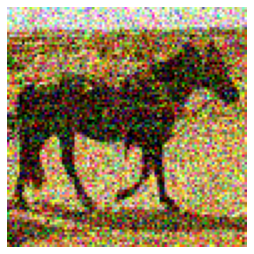

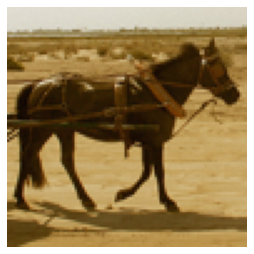

In [ ]:
random_images = Diff_train_dataset[130]
input, target = random_images

plt.figure(figsize=(15,15))
plt.subplot(3,1,1)
plt.imshow(input.permute(1,2,0), cmap='gray')
plt.axis('off')

plt.figure(figsize=(15,15))
plt.subplot(3,2,1)
plt.imshow(target.permute(1,2,0), cmap='gray')
plt.axis('off')

## Database (Grayscale)

In [ ]:
class GrayDB(Dataset):
    
    def __init__(self, PM_imgs_path, noise_imgs_path, origin_imgs_path):
        super().__init__()
        
        self.PM_imgs_path = PM_imgs_path
        self.noise_imgs_path = noise_imgs_path
        self.origin_imgs_path = origin_imgs_path
        self.PM_dataset = sorted(os.listdir(self.PM_imgs_path))
        self.noise_dataset = sorted(os.listdir(self.noise_imgs_path))
        self.origin_dataset = sorted(os.listdir(self.origin_imgs_path))

    def __len__(self):        
        length = len(self.origin_dataset)
        
        return length

    def __getitem__(self, idx):
        trans = transforms.ToTensor()

        PM_img_name = self.PM_dataset[idx]
        PM_img_path = os.path.join(self.PM_imgs_path,PM_img_name)
        full_PM_image = Image.open(PM_img_path).convert('L')
        PM_image = trans(full_PM_image)
        #input_image = input_image[:,:35,:25]

        noise_img_name = self.noise_dataset[idx]
        noise_img_path = os.path.join(self.noise_imgs_path,noise_img_name)
        full_noise_image = Image.open(noise_img_path).convert('L')
        noise_image = trans(full_noise_image)
        # noise_image = PM_Net(trans(full_noise_image).to(device).reshape((1,1,96,96))).reshape((1,96,96))
        #input_image = input_image[:,:35,:25]
        
        origin_img_name = self.origin_dataset[idx]
        origin_img_path = os.path.join(self.origin_imgs_path,origin_img_name)
        full_origin_image = Image.open(origin_img_path).convert('L')
        origin_image = trans(full_origin_image)
        #target_image = target_image[:,:35,:25]
        
        return (PM_image, noise_image, origin_image)

In [ ]:
PM_train_path = "./data/train_PM"
noise_train_path = "./data/train_noise"
origin_train_path = "./data/train"
Gray_train_dataset = GrayDB(PM_train_path, noise_train_path,origin_train_path)

PM_test_path = "./data/test_PM"
noise_test_path = "./data/test_noise"
origin_test_path = "./data/test"
Gray_test_dataset = GrayDB(PM_test_path, noise_test_path, origin_test_path)


train_data = DataLoader(Gray_train_dataset, batch_size=8)
train_len = len(Gray_train_dataset)

test_data = DataLoader(Gray_test_dataset, batch_size=8)
test_len = len(Gray_test_dataset)


In [ ]:
random_images = Gray_train_dataset[130]
PM, noise, origin = random_images
PM = PM.permute(1,2,0)
noise = noise.permute(1,2,0)
origin = origin.permute(1,2,0)
#noise = torch.tensor(random_noise(target, mode='gaussian', mean=0, var=0.01, clip=True))

plt.figure(figsize=(15,15))
plt.subplot(3,1,1)
plt.imshow(PM[:,:,0], cmap='gray')
plt.axis('off')

plt.figure(figsize=(15,15))
plt.subplot(3,2,1)
plt.imshow(noise[:,:,0].cpu().detach().numpy(), cmap='gray')
plt.axis('off')

plt.figure(figsize=(15,15))
plt.subplot(3,3,1)
plt.imshow(origin[:,:,0], cmap='gray')
plt.axis('off')

NameError: ignored

## Train

In [ ]:
def diffusion_loss(input,target):
    Loss = torch.nn.MSELoss()
    diff_loss = Loss(input,target)
 
    return diff_loss



In [ ]:
# in_channels = [1,1,1,1]# 3 # V1: [3,3,3,3]
# out_channels = [64,64,64,64]#[64,128,64,3]# V1: [64,64,64,64]
# #diffusion_model = AnisoDiffNet(in_channels, out_channels).to(device)
# #diffusion_model = PMNet(in_channels, out_channels).to(device)
# #diffusion_model = anisoV2Net(in_channels, out_channels).to(device)
# singleDiff_lr = 0.0001
# singleDiff_optimizer = optim.Adam(diffusion_model.parameters(), lr = singleDiff_lr)

# singleDiff_epoch = 500

In [463]:
in_channels = [1,1,1,1]# 3 # V1: [3,3,3,3]
out_channels = [64,64,64,64]#[64,128,64,3]# V1: [64,64,64,64]
# diffusion_model = DiffNet(in_channels, out_channels).to(device) # Wz
# diffusion_model = GradDiffNet(in_channels, out_channels).to(device) #DwLF
# diffusion_model = GradFDiffNet(in_channels, out_channels).to(device) #DwLFGrad
diffusion_model = GradSharediNet(in_channels, out_channels).to(device) # DwLFComb
#diffusion_model = SharedDiffNet(in_channels, out_channels).to(device) # WzShared
# diffusion_model = GradSharedpiNet(in_channels, out_channels).to(device) # DwLFShared






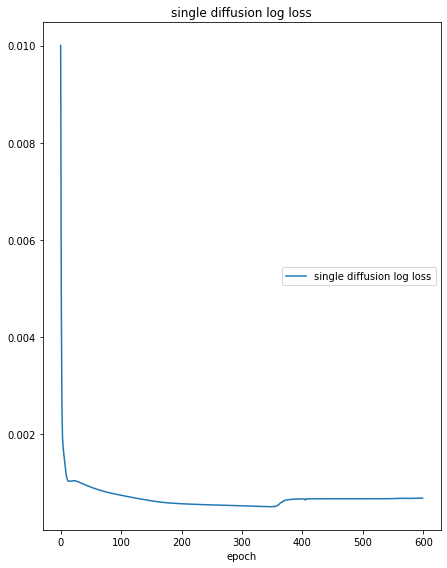

single diffusion log loss
	single diffusion log loss 	 (min:    0.001, max:    0.010, cur:    0.001)
In step 599, loss is 0.0006866014446131885


In [464]:
single_liveloss = PlotLosses()
singleDiff_epoch = 600
singleDiff_lr = 0.0001
singleDiff_optimizer = optim.Adam(diffusion_model.parameters(), lr = singleDiff_lr)
# 1. origin -> PM : smoothing - approximate PM filter, forward
# 2. PM -> origin : reconstruction - inverse
# 3. noise -> origin : denoise

for i in range(singleDiff_epoch):
  singleDiff_logs = {}
  for data in train_data:
    PM, noise, origin = data
    PM = PM.to(device)
    noise = noise.to(device)
    # noise = PM_Net(noise).detach()
    origin = origin.to(device)

    singleDiff_optimizer.zero_grad()
    singleDiff_output = diffusion_model(noise).to(device)
    singleDiff_loss = diffusion_loss(singleDiff_output, PM)

    singleDiff_loss.backward()
    singleDiff_optimizer.step()
    
    singleDiff_logs['single diffusion log loss'] = singleDiff_loss.item()
  single_liveloss.update(singleDiff_logs)
  single_liveloss.send()
  print("In step {}, loss is {}".format(i, singleDiff_loss.item()))

#end_solution


In [ ]:
!nvidia-smi -L

GPU 0: Tesla T4 (UUID: GPU-cd1337aa-c6b6-5508-1a35-718cdb8dc419)


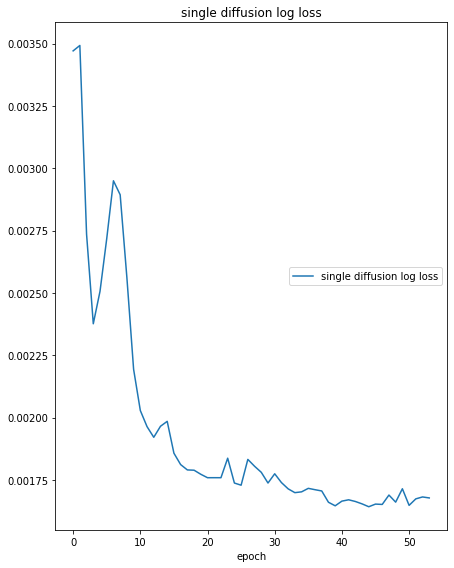

single diffusion log loss
	single diffusion log loss 	 (min:    0.002, max:    0.003, cur:    0.002)
In step 53, loss is 0.0016774354735389352


In [ ]:
single_liveloss = PlotLosses()

for i in range(singleDiff_epoch):
  singleDiff_logs = {}
  for data in train_data:
    input,target = data
    input = input.to(device)
    target = target.to(device)

    singleDiff_optimizer.zero_grad()
    singleDiff_output = diffusion_model(input).to(device)
    singleDiff_loss = diffusion_loss(singleDiff_output, target)

    singleDiff_loss.backward()
    singleDiff_optimizer.step()
    
    singleDiff_logs['single diffusion log loss'] = singleDiff_loss.item()
  single_liveloss.update(singleDiff_logs)
  single_liveloss.send()
  print("In step {}, loss is {}".format(i, singleDiff_loss.item()))

#end_solution


### save

In [465]:
torch.save(diffusion_model, 'models/noiseDiff_DwLFComb_Net.pth')
#torch.save(block, 'models/denoise_Multi_block_90.pth')

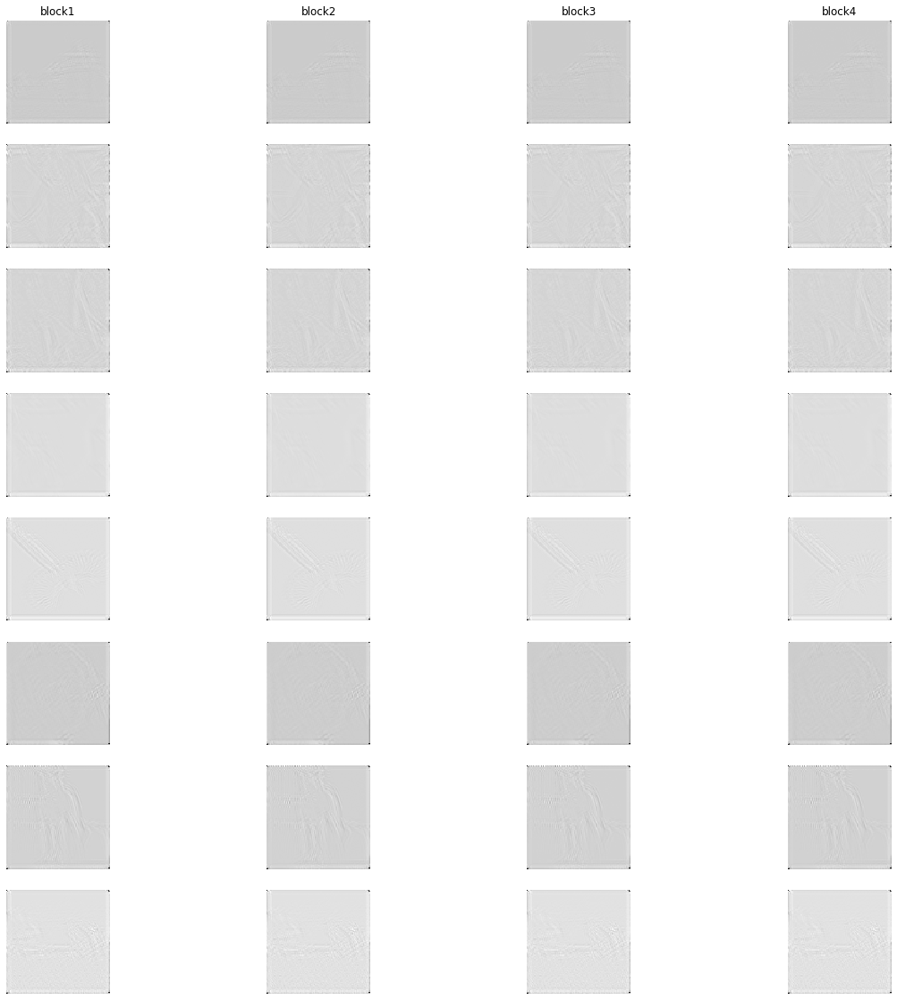

In [ ]:
#torch.save(single_diff, 'models/Diffusion.pth')
activation1 = diffusion_model.difference1
activation2 = diffusion_model.difference2
activation3 = diffusion_model.difference3
activation4 = diffusion_model.difference4
phi_list1 = []
phi_list2 = []
phi_list3 = []
phi_list4 = []
for i, phi in enumerate(activation1):
  phi_list1.append(phi.permute(1,2,0))
  phi_list2.append(activation2[i].permute(1,2,0))
  phi_list3.append(activation3[i].permute(1,2,0))
  phi_list4.append(activation4[i].permute(1,2,0))


phi_plot1 = [ el.cpu().detach().squeeze().numpy() for el in phi_list1]
phi_plot2 = [ el.cpu().detach().squeeze().numpy() for el in phi_list2]
phi_plot3 = [ el.cpu().detach().squeeze().numpy() for el in phi_list3]
phi_plot4 = [ el.cpu().detach().squeeze().numpy() for el in phi_list4]
# imgs_plot = [ el.cpu().squeeze().numpy() for el in target_list]
# aniso_plot = [ el.cpu().detach().squeeze().numpy() for el in aniso_output]
# PM_plot = [ el.cpu().detach().squeeze().numpy() for el in PM_output]


img = [phi_plot1, phi_plot2, phi_plot3, phi_plot4]
title = ['block1', 'block2', 'block3', 'block4']
plot_images(img, title, None)
plt.show()
plt.close()

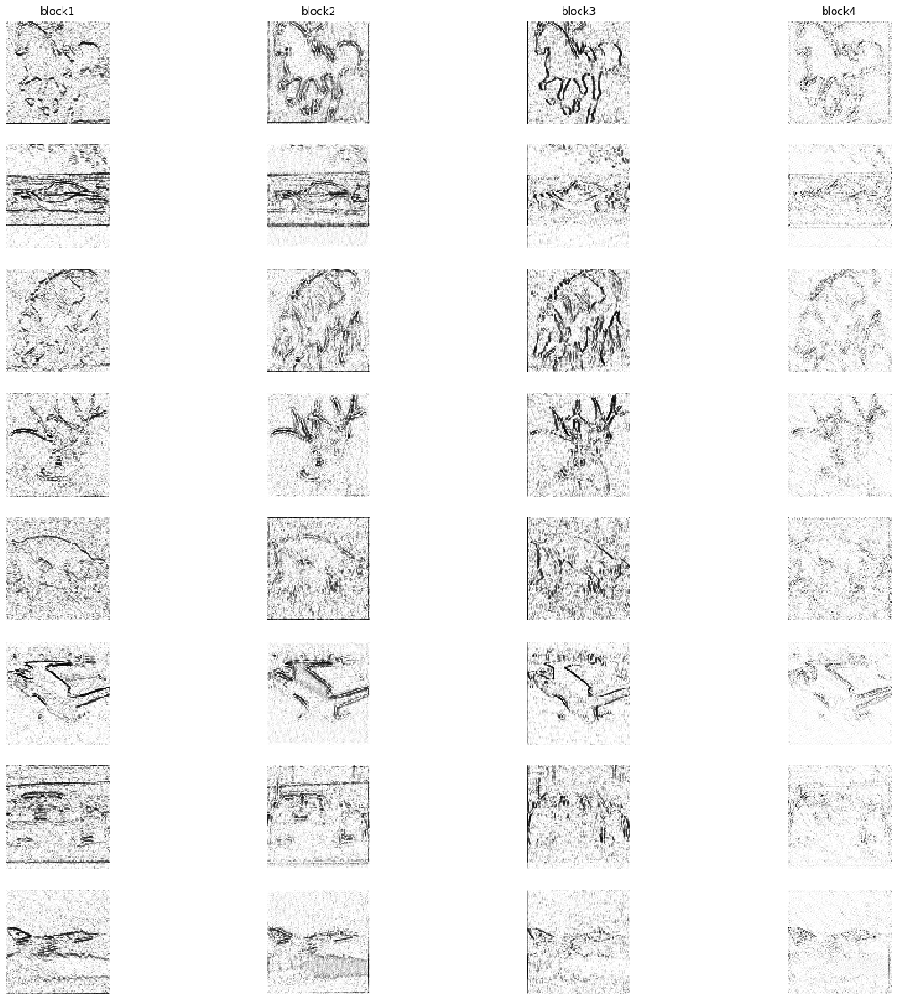

In [ ]:
kappa1 = diffusion_model.block1.activation.kappa
kappa2 = diffusion_model.block2.activation.kappa
kappa3 = diffusion_model.block3.activation.kappa
kappa4 = diffusion_model.block4.activation.kappa
kappa_list1 = []
kappa_list2 = []
kappa_list3 = []
kappa_list4 = []
for i, kappa in enumerate(kappa1):
  kappa_list1.append(kappa.permute(1,2,0))
  kappa_list2.append(kappa2[i].permute(1,2,0))
  kappa_list3.append(kappa3[i].permute(1,2,0))
  kappa_list4.append(kappa4[i].permute(1,2,0))


kappa_plot1 = [ el.cpu().detach().squeeze().numpy() for el in kappa_list1]
kappa_plot2 = [ el.cpu().detach().squeeze().numpy() for el in kappa_list2]
kappa_plot3 = [ el.cpu().detach().squeeze().numpy() for el in kappa_list3]
kappa_plot4 = [ el.cpu().detach().squeeze().numpy() for el in kappa_list4]
# imgs_plot = [ el.cpu().squeeze().numpy() for el in target_list]
# aniso_plot = [ el.cpu().detach().squeeze().numpy() for el in aniso_output]
# PM_plot = [ el.cpu().detach().squeeze().numpy() for el in PM_output]


img = [kappa_plot1, kappa_plot2, kappa_plot3, kappa_plot4]
title = ['block1', 'block2', 'block3', 'block4']
plot_images(img, title, None)
plt.show()
plt.close()

Records:

MSELoss()

in [3,3,3,3] <br>
out [64,64,64,64] => 1.5 mins per epoch

DiffNetV2

Adam + lr: 0.0001, 0.01, 0.003, 0.0003 <br>
results: 0.024, 0.040, 0.029, 0.023 (saved)

SGD + 0.01 lr: 

out [64,128,256,512] => 12 mins per epoch

Adam + 0.0001 lr: 0.022 (saved)


---

[3,3,3,3], [64,64,64,64] => 20s

v2, Adam + 0.0003

result start: 0.023 <br>
after 100 epoches: 0.0219


bias = true => 25s <br>
result start: 0.0229 <br>
after 174 epoches: 0.022089961916208267


---
run without couple activation -> still same

---

8 multi-single block

30s per epoch

result start: 0.023

first decay: 0.0002

still same

In step 14, loss is 0.022517524659633636

Worse effect on test set


---

add batchNorm -> start 0.028, end In step 216, loss is 0.021833155304193497

---

keep 0.02x -> lr too small? local optimize

---
resnet, 25s per epoch -> start with 0.007, end 0.0023 (300+ epoches)

3x25x25

---
modify diffusion from resnet, start with 0.290, End in step 132, loss is 0.0038307011127471924

3,32,32 => 35s per epoch

info saved: model, train plot

---
ResNet **with bias** - start 0.0086, In step 499, loss is **0.0022352735977619886**

3x32x32
28s per epoch

smooth, info saved: model, train plot, train img, test img

---
Modified diffusion from ResNet **with bias** - start 0.229, In step 245, loss is **0.0029170718044042587**

3x32x32
37s per epoch

---
modified diffusion version 2.0
start in step 0, loss is 0.04133715480566025
hard to reduce loss, 3x32x32

only keeps diffusion blocks <br>
time step = 1 <br>
20 diffusion blocks (diffusion step) 


1 min 12s per epoch -> 72s

-
for image with size 3x8x8, v2 diffusion runs 30s per epoch and starts with loss = 0.051, but hard to reduce around 0.04

---
add block 1 in diffusion v2 (no maxPool in block2), start loss = 0.062, and reduces to 0.029 in 2nd epoch, In step 136, loss is 0.002280235756188631

image size = 3x8x8, time step = 1, iteration = 20 <br>
37s per epoch

rugged

but, not good at neither train or test, image is too small

-> change img size to 25x25

---
delete layers in blocks one by one, see which one is the key

try same strategy in ResNet

change v2 timestep to 0.1

---
same as v1 but timestep = 1, iteration = 8, and delete maxPool before first diffusion block

img size 3x25x25

start loss = 0.012,In step 183, loss is **0.0021828103344887495**

40s per epoch

torch.Size([8, 96, 96, 1])
(96, 96)
(96, 96)
(96, 96)
(96, 96)
(96, 96)
(96, 96)
(96, 96)
(96, 96)


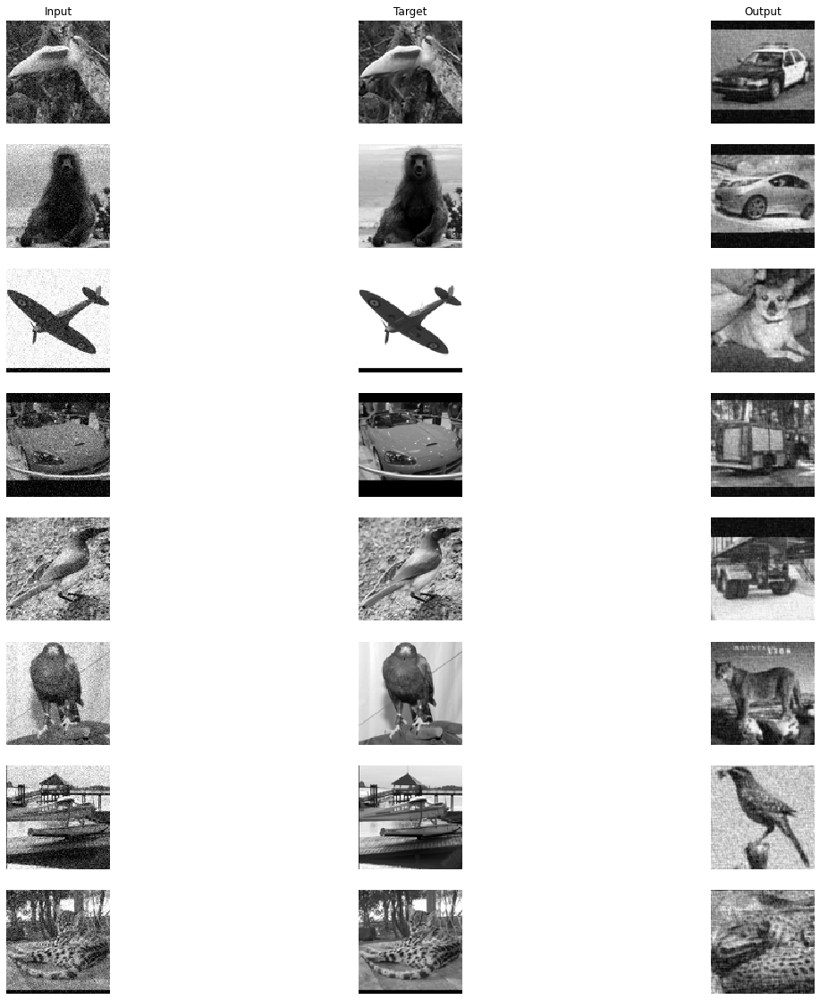

In [ ]:
input = input.permute(0,2,3,1)
target = target.permute(0,2,3,1)
singleDiff_output = singleDiff_output.permute(0,2,3,1)
print(input.shape)

input_plot = [ el.cpu().detach().squeeze().numpy() for el in input]
imgs_plot = [ el.cpu().squeeze().numpy() for el in target]
pred_plot = [ el.cpu().detach().squeeze().numpy() for el in singleDiff_output]
for j,img in enumerate(input_plot):
  print(img.shape)
#print(len(pred_plot[0]))

img = [input_plot, imgs_plot, pred_plot]
title = ['Input', 'Target', 'Output']
plot_images(img, title, None)
plt.show()
plt.close()

## Test (RGB)

In [ ]:
anisoNet = torch.load('models/Diffusion-3.pth')

In [ ]:
isoNet = torch.load('models/Diffusion.pth')

In [ ]:
resNet = torch.load('models/ResNet(0.0022).pth')

In [ ]:
anisoNet = torch.load('models/iso_Diffusion(0.0028).pth')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

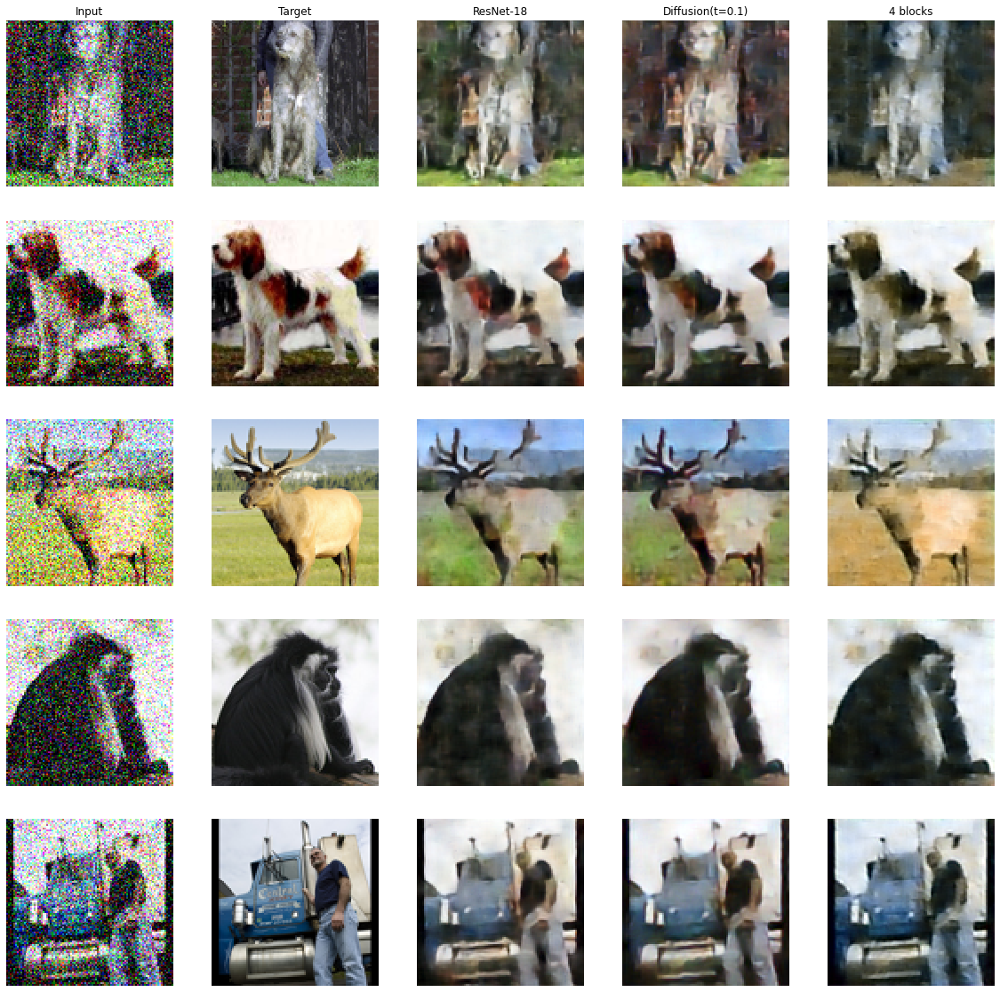

In [ ]:
indices = np.random.choice(range(len(Diff_test_dataset)), 5, replace=False)
#indices = np.random.choice(range(len(Diff_train_dataset)), 5, replace=False)
random_images = [Diff_test_dataset[idx] for idx in indices]

#cur_diff_output = []
aniso_output = []
iso_output = []
target_list = []
input_list = []
dataloader = DataLoader(random_images)

for data in dataloader:
  input,target = data
  input = input.to(device)
  input_list.append(input.permute(0,2,3,1))
  target_list.append(target.to(device).permute(0,2,3,1))
  #cur_diff_output.append(cur_diffNet(input).permute(0,2,3,1))
  aniso_output.append(anisoNet(input).permute(0,2,3,1))
  iso_output.append(isoNet(input).permute(0,2,3,1))

input_plot = [ el.cpu().detach().squeeze().numpy() for el in input_list]
imgs_plot = [ el.cpu().squeeze().numpy() for el in target_list]
#cur_diff_plot = [ el.cpu().detach().squeeze().numpy() for el in cur_diff_output]
aniso_plot = [ el.cpu().detach().squeeze().numpy() for el in aniso_output]
iso_plot = [ el.cpu().detach().squeeze().numpy() for el in iso_output]


img = [input_plot, imgs_plot, aniso_plot, iso_plot]
title = ['Input', 'Target', 'aniso', 'iso']
plot_images(img, title, None)
plt.show()
plt.close()

Train methods

different types of adding noise:

Gaussian, salt&pepper, speckel

## PM test(Gray)

In [ ]:
indices = np.random.choice(range(len(Gray_test_dataset)), 50, replace=False)
random_images = [Gray_test_dataset[idx] for idx in indices]

dataloader = DataLoader(random_images, batch_size = 10)

In [ ]:
indices1 = np.random.choice(range(len(Gray_train_dataset)), 50, replace=False)
random_images1 = [Gray_train_dataset[idx] for idx in indices1]

dataloader1 = DataLoader(random_images1, batch_size = 10)

In [ ]:
indices = np.random.choice(range(len(Gray_test_dataset)), 2, replace=False)
random_images = [Gray_test_dataset[idx] for idx in indices]

dataloader2 = DataLoader(random_images, batch_size = 2)

In [ ]:
indices = np.random.choice(range(len(Gray_test_dataset)), 2, replace=False)
random_images = [Gray_train_dataset[idx] for idx in indices]

dataloader3 = DataLoader(random_images, batch_size = 2)

In [490]:
PM_Net = torch.load('./models/noiseSmoothing_Wz_Net.pth')
# improve_net = torch.load('./models/denoise_DwLF_Net.pth')
#PM_Net_70 = torch.load('models/smoothing_Multi_Net_80.pth')

In [ ]:
PM_block = torch.load('models/denoise_Grad_block_90.pth')
#PM_block_70 = torch.load('models/smoothing_Grad_block_100.pth')
#PM_block = torch.load('models/PM_block.pth')

In [ ]:
PM_stack_Net = Grad_stack_DiffNet(PM_block, 4).to(device)
#PM_stack_Net_70 = Grad_stack_DiffNet(PM_block_70, 4).to(device)


### Target, Noise, Output

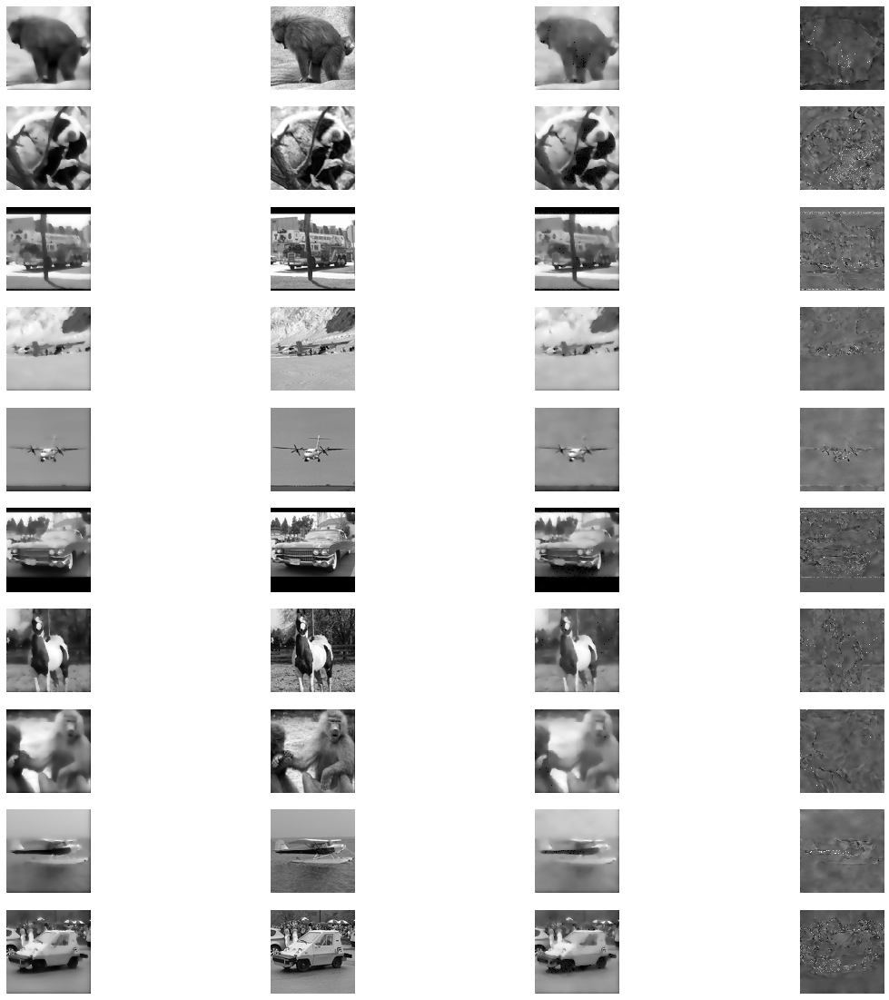

In [495]:
# PM_list = PM.permute(0,2,3,1)
# noise_list = noise.permute(0,2,3,1)
# origin_list = origin.permute(0,2,3,1)
# PM_output = PM_Net(PM).permute(0,2,3,1)

PM_list = []
noise_list = []
origin_list = []
PM_output = []
difference = []

for data in dataloader1:
  PM, noise, origin = data
  PM = PM.to(device)
  noise = noise.to(device)
  origin = origin.to(device)
  output = PM_Net(noise)
  PM_list.append(PM.permute(0,2,3,1))
  noise_list.append(noise.permute(0,2,3,1))
  origin_list.append(origin.permute(0,2,3,1))
  PM_output.append(output.permute(0,2,3,1))
  difference.append(PM.permute(0,2,3,1) - output.permute(0,2,3,1))

# gauss_rect1 = torch.tensor(gauss_rect1, dtype=torch.float32).to(device)
# gauss_rect2 = torch.tensor(gauss_rect2, dtype=torch.float32).to(device)
# rect_list = torch.cat((gauss_rect1,gauss_rect2))
# PM_output.append(PM_Net(rect_list).permute(0,2,3,1))
# PM_output.append(PM_Net(gauss_rect2).permute(0,2,3,1))
  #PM_output_70 = PM_Net_70(origin).permute(0,2,3,1)
  #PM_stack_output = PM_stack_Net(noise).permute(0,2,3,1)
  #PM_stack_output_70 = PM_stack_Net_70(origin).permute(0,2,3,1)
  
 

# differences1 = PM_list - PM_output
# differences2 = PM_list - PM_output_70
# # differences3 = PM_output_70 - PM_output
# PM_plot = []
# noise_plot = []
# origin_plot = []
# PM_Net_plot = []


PM_plot = [ el.cpu().detach().squeeze().numpy() for el in PM_list]
noise_plot = [ el.cpu().detach().squeeze().numpy() for el in noise_list]
origin_plot = [ el.cpu().detach().squeeze().numpy() for el in origin_list]
PM_Net_plot= [ el.cpu().detach().squeeze().numpy() for el in PM_output]

# for i in range(5):
#   PM_plot.append([ el.cpu().detach().squeeze().numpy() for el in PM_list[i]])
#   noise_plot.append([ el.cpu().detach().squeeze().numpy() for el in noise_list[i]])
#   origin_plot.append([ el.cpu().detach().squeeze().numpy() for el in origin_list[i]])
#   PM_Net_plot.append([ el.cpu().detach().squeeze().numpy() for el in PM_output[i]])

# PM_Net_plot_70 = [el.cpu().detach().squeeze().numpy() for el in PM_output_70]

#PM_stack_plot = [ el.cpu().detach().squeeze().numpy() for el in PM_stack_output]
# PM_stack_plot_70 = [el.cpu().detach().squeeze().numpy() for el in PM_stack_output_70]

differences1_plot = [el.cpu().detach().squeeze().numpy() for el in difference]
# differences2_plot = [el.cpu().detach().squeeze().numpy() for el in differences2]
# differences3_plot = [el.cpu().detach().squeeze().numpy() for el in differences3]
# diff1 = difference[0][0]
# mse = torch.sqrt(torch.sum(torch.square(diff1)))
# print(mse)

# diff2 = difference[0][1]
# mse2 = torch.sqrt(torch.sum(torch.square(diff2)))
# print(mse2)


# img = [origin_plot[0], PM_plot[0], PM_Net_plot[0]]
# title = ['Input-origin', 'Target-PM', 'PM-4s']
img = [PM_plot[0], origin_plot[0], PM_Net_plot[0], differences1_plot[0]]
title = ['Origin','Target-PM', 'Multi', 'difference']
plot_images(img, None, None)
plt.show()
plt.close()



In [571]:
os.makedirs('results/denoise', exist_ok=True)
!unzip './Archive.zip' -d './results/denoise'

Archive:  ./Archive.zip
  inflating: ./results/denoise/d8.png  
  inflating: ./results/denoise/__MACOSX/._d8.png  
  inflating: ./results/denoise/d7.png  
  inflating: ./results/denoise/__MACOSX/._d7.png  
  inflating: ./results/denoise/d6.png  
  inflating: ./results/denoise/__MACOSX/._d6.png  
  inflating: ./results/denoise/d5.png  
  inflating: ./results/denoise/__MACOSX/._d5.png  
  inflating: ./results/denoise/d1.png  
  inflating: ./results/denoise/__MACOSX/._d1.png  
  inflating: ./results/denoise/d2.png  
  inflating: ./results/denoise/__MACOSX/._d2.png  
  inflating: ./results/denoise/d3.png  
  inflating: ./results/denoise/__MACOSX/._d3.png  
  inflating: ./results/denoise/d4.png  
  inflating: ./results/denoise/__MACOSX/._d4.png  
  inflating: ./results/denoise/8.png  
  inflating: ./results/denoise/__MACOSX/._8.png  
  inflating: ./results/denoise/4.png  
  inflating: ./results/denoise/__MACOSX/._4.png  
  inflating: ./results/denoise/3.png  
  inflating: ./results/denoise/

In [578]:
trans = transforms.ToTensor()
full_origin_image = Image.open('./results/denoise/1.png').convert('L')
origin_image = trans(full_origin_image)
print(origin_image)
mse = torch.sqrt(torch.sum(torch.square(origin_image)))# / (96*96) 
print(mse)

tensor([[[0.4118, 0.4471, 0.4706,  ..., 0.3059, 0.3373, 0.4196],
         [0.4863, 0.4627, 0.5059,  ..., 0.2706, 0.3529, 0.4510],
         [0.3804, 0.4118, 0.3961,  ..., 0.3765, 0.4549, 0.4000],
         ...,
         [0.0980, 0.0157, 0.0275,  ..., 0.3412, 0.4863, 0.3843],
         [0.0431, 0.0824, 0.1569,  ..., 0.2980, 0.3373, 0.4235],
         [0.0824, 0.3176, 0.4431,  ..., 0.4000, 0.4157, 0.6627]]])
tensor(50.5746)


In [558]:
diff1 = difference[0][0]
mse = torch.sum(torch.square(origin_image)) / (222*222) 
print(mse / 31.3)

tensor(0.0083)


In [492]:
os.makedirs('results/Shared/', exist_ok=True)
# for j, image in enumerate(differences1_plot[0]):
save_image(torch.tensor(PM_Net_plot[0][0].squeeze()), 'results/Shared/1.png', normalize=True)
save_image(torch.tensor(difference[0][0].squeeze()), 'results/Shared/diff1.png', normalize=True)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  after removing the cwd from sys.path.


In [496]:
PSNR = 0
SSIM = 0
31.7577
print(len(PM_plot[0]))

for i, images in enumerate(PM_plot):
  for j, image in enumerate(images):
    #img1 = origin_plot[i]
    img2 = PM_Net_plot[i][j]
    PSNR += peak_signal_noise_ratio(image, img2)
    SSIM += structural_similarity(image, img2)
print(PSNR/50)
print(SSIM /50)

# 28.23662029460214
# 0.9826570925265156

# 27.794304887420473
# 0.9821445785330833

# 29.034414610284863
# 0.9266606881265534

#train - denoise
# 28.462044087925552
# 0.9182639140103549

# improve - denoise
# 26.533933332864812
# 0.9137383820417502

# DwLF - 4 blocks
# 29.19650437523533
# 0.9285175720330338

# DwLF - 8 blocks
# 28.75514387845625
# 0.9269952753682246

# DwLF - 6 blocks
# 28.79188178397635
# 0.9273973854521134

# DwLF - 2 blocks
# 28.76395393197065
# 0.9247928885936655

# DwLF - 3 blocks
# 28.86134551469131
# 0.9271963147312338

# DwLF - 4 blocks
# 28.903669482663716
# 0.9273798799900794

# DwLF - artifacts 10 blocks
# 27.901087969256487
# 0.9562270959181466

# relu diff
# 31.767552592610706
# 0.9842852294790221

# DwLF Shared smooth
# 32.189861444540774
# 0.9876371946590122

# DwLF Grad smooth
# 32.154767414651346
# 0.9863374349473708

# DwLF
# 32.89991719611975
# 0.9877165658987308

# 32.26547083968153
# 0.9850425150985148

#DwLF shared smoothing
# 31.28568044903747
# 0.9860859776450931

#DwLF comb grad
# 30.0748324588238
# 0.9803688571160546

10
31.800122503708877
0.9650817698511244


In [ ]:
PSNR = 0
SSIM = 0
for data in train_data:
  PM, noise, origin = data
  for i, image in enumerate(origin):
    image = image.detach().squeeze().numpy()
    noise_img = noise[i].detach().squeeze().numpy()
    PSNR+= peak_signal_noise_ratio(image, noise_img)
    SSIM += structural_similarity(image, noise_img)

print(PSNR/300)
print(SSIM/300)

#PM 25.92837780676716
# 0.8689244413331652



23.258795860629867
0.7189743005196121


Save images

In [ ]:
os.makedirs('results/output', exist_ok=True)

save_image(torch.tensor(origin_plot[5]), 'results/output/test_Origin_0.png', normalize=True)
save_image(torch.tensor(noise_plot[5]), 'results/output/test_PM_0.png', normalize=True)
save_image(torch.tensor(PM_Net_plot[5]), 'results/output/test_Wz_0.png'.format(i), normalize=True)
save_image(torch.tensor(differences1_plot[5]), 'results/output/test_difference_0.png', normalize=True)



In [ ]:
#os.makedirs('results/zip', exist_ok=True)
shutil.make_archive('results/denoise_output', 'zip', 'results/output')

'/content/results/denoise_output.zip'

### image gradient

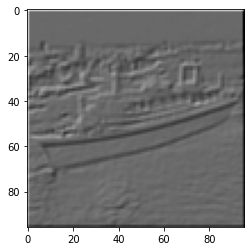

In [377]:
from scipy import ndimage
# os.makedirs('results/grad', exist_ok=True)

#img = origin_list[0]
_,_,img = Gray_test_dataset[266]
img = img.squeeze()
# img = img.reshape((1,1,96,96))
# img = img.squeeze()
grad = []

# kernel_x = torch.Tensor([[1,2,1],[0,0,0],[-1,-2,-1]]).reshape((1,1,3,3))
# print(kernel_x)
# print(image.shape)
# sx = F.conv2d(img, kernel_x)

sx = ndimage.sobel(img,axis=0,mode='constant')
# Get y-gradient in "sy"
sy = ndimage.sobel(img,axis=1,mode='constant')
# Get square root of sum of squares
#norm = np.sqrt(sx**2 + sy**2)
sobel=np.hypot(sx,sy)
comb = sx+sy
# grad.append(sx)
# grad.append(sy)
# grad.append(sobel)

# for j, image in enumerate(grad):
#  save_image(torch.tensor(image), 'results/grad/1_{}.png'.format(j), normalize=True)

#shutil.make_archive('results/grad', 'zip', 'results/grad')


# Hopefully see some edges
#plt.imshow(sx,cmap=plt.cm.gray)
plt.imshow(comb,cmap=plt.cm.gray)
plt.show()

In [378]:
save_image(torch.tensor(comb), 'results/Shared/comb_boat.png', normalize=True)

### Activation - phi

In [432]:
#torch.save(single_diff, 'models/Diffusion.pth')
# wz - diff_image, kfilter, W_operator, activation, difference
# shared - diff_image, div, kfilter, activation, difference
kappa = []
# print(PM_Net.div1.shape)

kappa.append(PM_Net.div1.reshape((4,1,96,96)))
kappa.append(PM_Net.div2.reshape((4,1,96,96)))
kappa.append(PM_Net.div3.reshape((4,1,96,96)))
kappa.append(PM_Net.div4.reshape((4,1,96,96)))
# kappa.append(PM_Net.div5)
# kappa.append(PM_Net.div6)
# kappa.append(PM_Net.div7)
# kappa.append(PM_Net.div8)
# kappa.append((PM_Net.div1[:,0,:,:] + PM_Net.div1[:,1,:,:]).reshape(-1,1,96,96))
# kappa.append((PM_Net.div2[:,0,:,:] + PM_Net.div2[:,1,:,:]).reshape(-1,1,96,96))


# kappa.append(PM_Net.div1)
# kappa.append(PM_Net.div2)
# kappa.append(PM_Net.div3)
# kappa.append(PM_Net.div4)

# kappa.append(PM_Net.div1 - PM_Net.image1)
# kappa.append(PM_Net.div2 - PM_Net.image1)
# kappa.append(PM_Net.div3 - PM_Net.image2)
# kappa.append(PM_Net.div4 - PM_Net.diff_image)

# kappa.append(PM_Net.kfilter1.reshape((4,1,96,96)))
# kappa.append(PM_Net.kfilter2.reshape((4,1,96,96)))
# kappa.append(PM_Net.kfilter3.reshape((4,1,96,96)))
# kappa.append(PM_Net.kfilter4.reshape((4,1,96,96)))

# kappa.append(PM_Net.kfilter1)
# kappa.append(PM_Net.kfilter2)
# kappa.append(PM_Net.kfilter3)
# kappa.append(PM_Net.kfilter4)

# torch.set_printoptions(profile="default")


# kappa.append(PM_Net.W_operator1)
# kappa.append(PM_Net.W_operator2)
# kappa.append(PM_Net.W_operator3)
# kappa.append(PM_Net.W_operator4)

# kappa.append(PM_Net.activation1 * 0.1)
# kappa.append(PM_Net.activation2 * 0.1)
# kappa.append(PM_Net.activation3 * 0.1)
# kappa.append(PM_Net.activation4 * 0.1)


# kappa.append(PM_Net.activation1.reshape((4,1,96,96)))
# kappa.append(PM_Net.activation2.reshape((4,1,96,96)))
# kappa.append(PM_Net.activation3.reshape((4,1,96,96)))
# kappa.append(PM_Net.activation4.reshape((4,1,96,96)))


# kappa.append(PM_Net.activation1)
# kappa.append(PM_Net.activation2)
# kappa.append(PM_Net.activation3)
# kappa.append(PM_Net.activation4)

# kappa.append(PM_Net.difference1)
# kappa.append(PM_Net.difference2)
# kappa.append(PM_Net.difference3)
# kappa.append(PM_Net.difference4)

# kappa.append(improve_net.difference1)
# kappa.append(improve_net.difference2)
# kappa.append(improve_net.difference3)
# kappa.append(improve_net.difference4)

# kappa.append(PM_Net.image1)
# kappa.append(PM_Net.image2)
# kappa.append(PM_Net.image3)
# kappa.append(PM_Net.diff_image)

# kappa.append(improve_net.image1)
# kappa.append(improve_net.image2)
# kappa.append(improve_net.image3)
# kappa.append(improve_net.diff_image)

save = False

plot_hidden_output(kappa, 'Shared_1200', 'img', 'train', save)

if(save):
  shutil.make_archive('results/Shared_1200/zip/shared_img', 'zip', 'results/Shared_1200/img')

RuntimeError: ignored

In [ ]:
shutil.make_archive('results/Shared_1200/zip', 'zip', 'results/Shared_1200/div')

'/content/results/Shared_1200/zip.zip'

In [ ]:
print(PM_Net)

GradSharediNet(
  (block): SharedBlock(
    (diff): Sequential(
      (0): Conv2d(1, 1, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    )
    (kappa): Sequential(
      (0): Conv2d(1, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): ReLU()
      (2): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (3): ReLU()
      (4): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (5): ReLU()
      (6): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (7): ReLU()
      (8): Conv2d(32, 1, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    )
  )
)


In [417]:
print(PM_Net.block)

SharedpBlock(
  (diff): Sequential(
    (0): Conv2d(1, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (2): Conv2d(64, 2, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  )
  (kappa): Sequential(
    (0): Conv2d(1, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
    (2): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU()
    (4): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): ReLU()
    (6): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU()
    (8): Conv2d(32, 1, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  )
  (transDiff): Sequential(
    (0): ConvTranspose2d(2, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ConvTranspose2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (2): ConvTranspose2d(64, 1, kernel_size=(3, 3), stride=(1, 1), padding=(1, 

In [420]:
print(PM_Net.block.transDiff[1].weight.shape)
#div_filter = PM_Net.block.kappa[2].weight.data

torch.Size([64, 64, 3, 3])


torch.Size([1, 32, 96, 96])


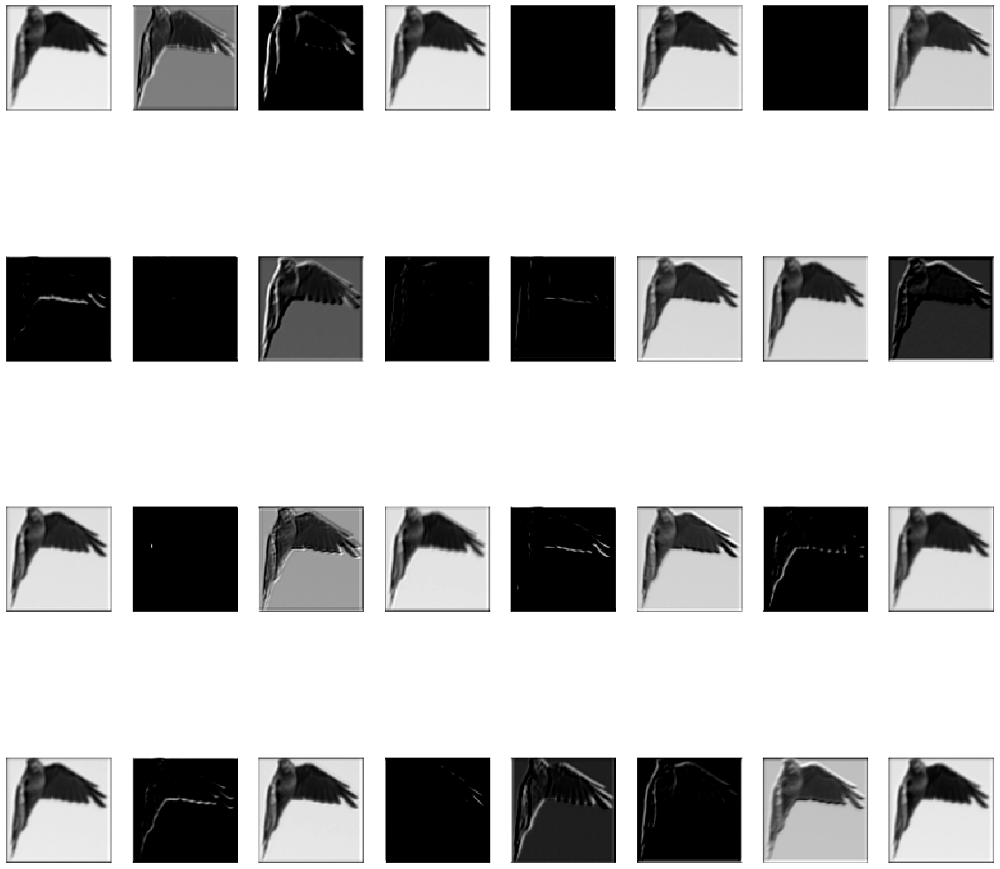

In [ ]:

_,_,filter_img = Gray_train_dataset[279]
filter_img = torch.unsqueeze(filter_img, dim=0).to(device)
div_filter1 = PM_Net.block.kappa[0].weight.data
div_filter2 = PM_Net.block.kappa[2].weight.data
div_filter3 = PM_Net.block.kappa[4].weight.data
div_filter4 = PM_Net.block.kappa[6].weight.data
# div_filter5 = PM_Net.block.kappa[8].weight.data

filtered1 = F.conv2d(filter_img, div_filter1,stride=1, padding=1)
filtered1 = F.relu(filtered1)
filtered2 = F.conv2d(filtered1, div_filter2,stride=1, padding=1)
filtered2 = F.relu(filtered2)
filtered3 = F.conv2d(filtered2, div_filter3,stride=1, padding=1)
filtered3 = F.relu(filtered3)
filtered4 = F.conv2d(filtered3, div_filter4,stride=1, padding=1)
filtered4 = F.relu(filtered4)
# filtered5 = F.conv2d(filtered4, div_filter5,stride=1, padding=1)

# plt.imshow(filtered3.squeeze().cpu(), cmap='gray')

print(filtered4.shape)
filtered_reshape = filtered4.reshape((8,4,96,96)).cpu()
plot_images(filtered_reshape, None,None)


### Kappa

In [ ]:
# kappa

# kappa = []
# kappa.append(PM_diffNet.block1.activation.kappa)
# kappa.append(PM_diffNet.block2.activation.kappa)
# kappa.append(PM_diffNet.block3.activation.kappa)
# kappa.append(PM_diffNet.block4.activation.kappa)
plot_hidden_output(PM_stack_Net.div_list, 'PM', 'kappa','test', False)
#plot_hidden_output(PM_stack_Net_70.div_list, 'PM', 'kappa','test', False)


NameError: ignored

Save

In [ ]:
shutil.make_archive('results/PM/zip/PM_kappa', 'zip', 'results/PM/kappa')

'/content/results/PM/zip/PM_kappa.zip'

### Divergence

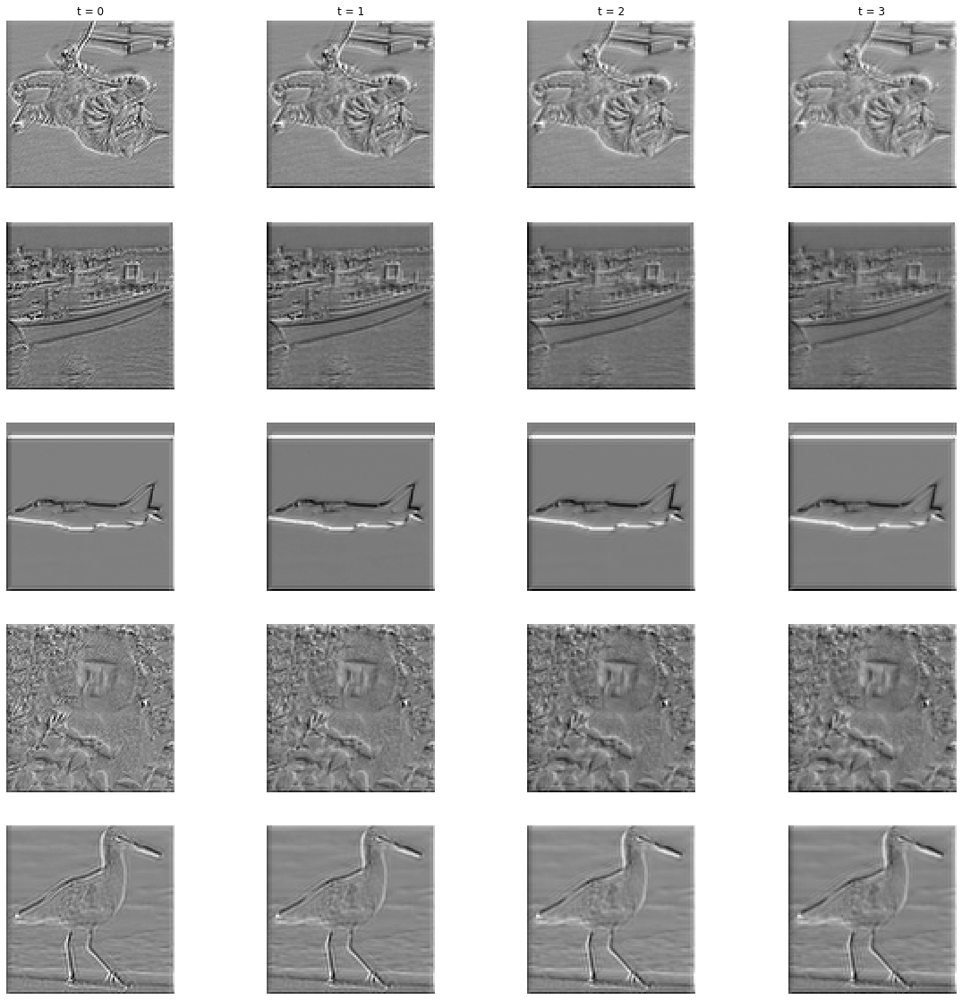

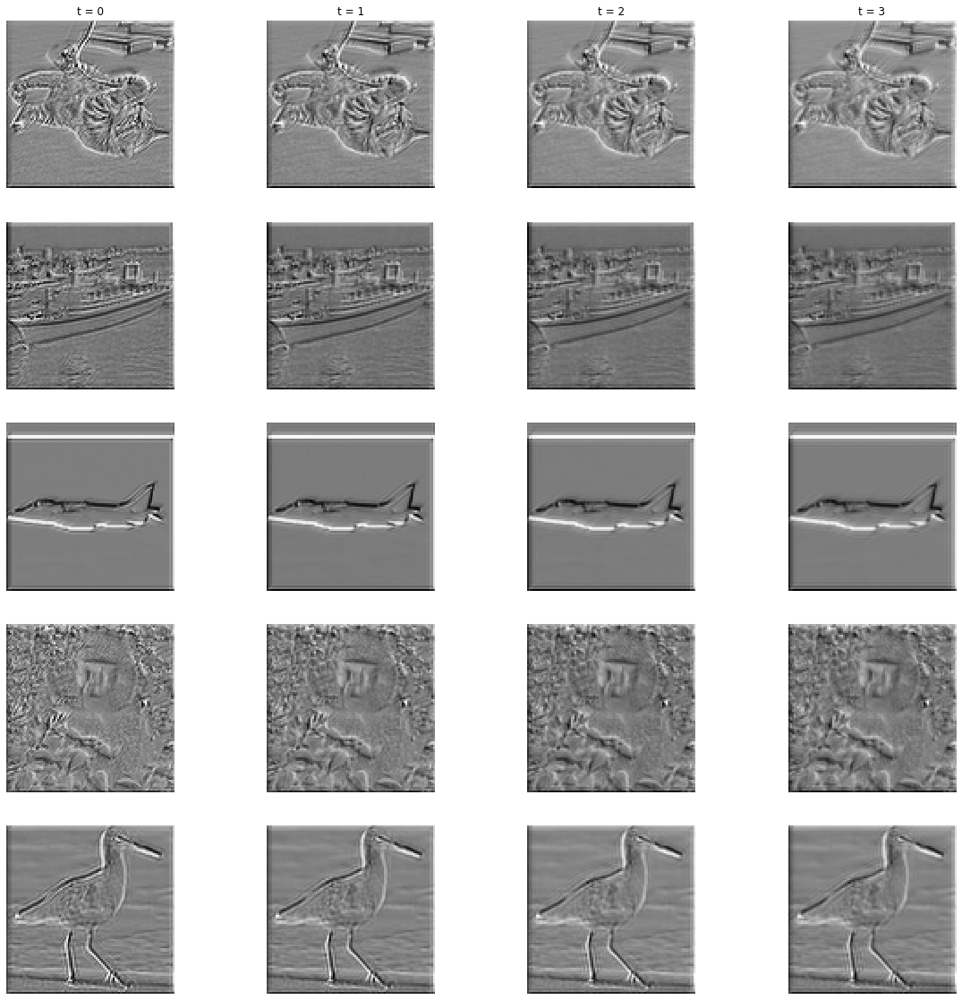

In [ ]:
# divergence
# div = []
# div.append(PM_Net.divergence1)
# div.append(PM_Net.divergence2)
# div.append(PM_Net.divergence3)
# div.append(PM_Net.divergence4)
# plot_hidden_output(div, 'PM', 'div','test', False)

act = []
act.append(PM_Net.out_activation1)
act.append(PM_Net.out_activation2)
act.append(PM_Net.out_activation3)
act.append(PM_Net.out_activation4)
plot_hidden_output(act, 'PM', 'act','test', False)


In [ ]:
# os.makedirs('results/PM/div', exist_ok=True)
# for i,img in enumerate(div_plot1):
#   save_image(torch.tensor(img), 'results/PM/div/test_div1_{}.png'.format(i))
#   save_image(torch.tensor(div_plot2[i]), 'results/PM/div/test_div2_{}.png'.format(i))
#   save_image(torch.tensor(div_plot3[i]), 'results/PM/div/test_div3_{}.png'.format(i))
#   save_image(torch.tensor(div_plot4[i]), 'results/PM/div/test_div4_{}.png'.format(i))

In [ ]:
shutil.make_archive('results/PM/zip/PM_div', 'zip', 'results/PM/div')

'/content/results/PM/zip/PM_div.zip'

### block output

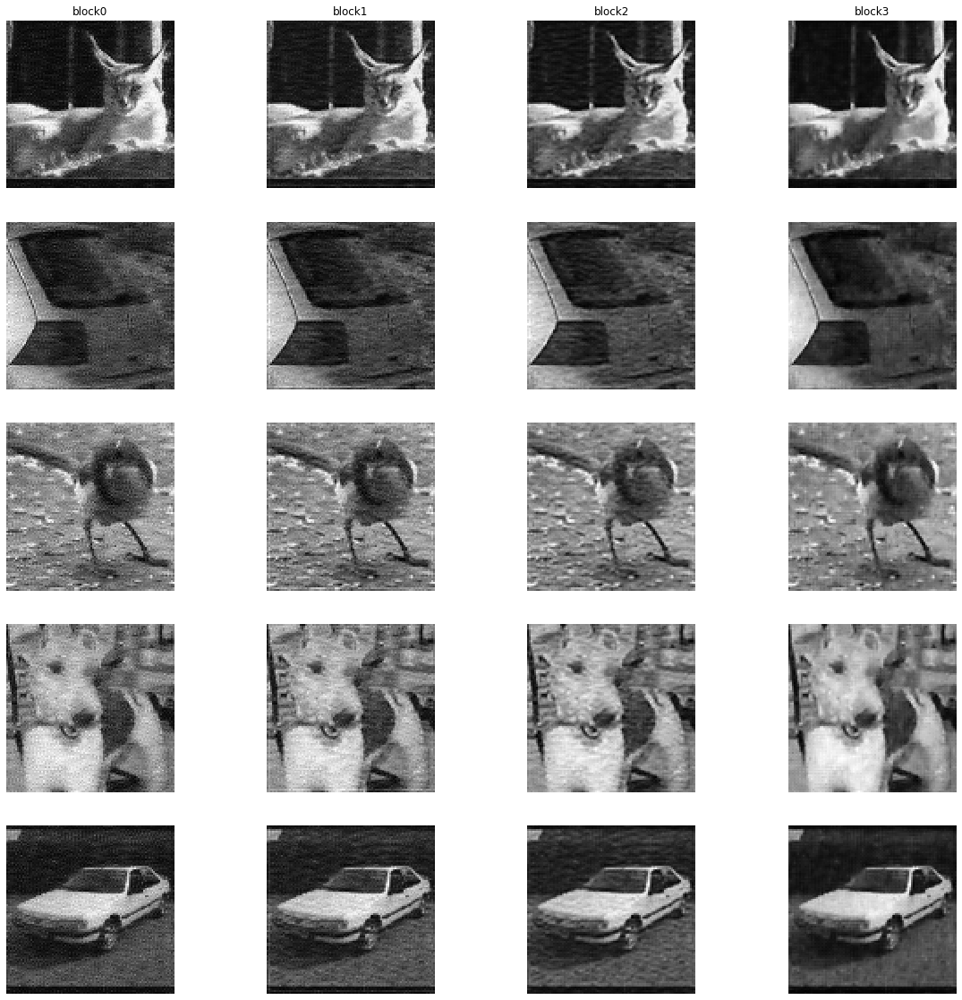

In [ ]:
# block output, self.diff_image

block_out = []
block_out.append(PM_diffNet.block1.diff_image)
block_out.append(PM_diffNet.block2.diff_image)
block_out.append(PM_diffNet.block3.diff_image)
block_out.append(PM_diffNet.block4.diff_image)
plot_hidden_output(block_out, 'PM', 'out','test', True)

In [ ]:
shutil.make_archive('results/PM/zip/PM_out', 'zip', 'results/PM/out')

'/content/results/PM/zip/PM_out.zip'

## Aniso Test (Gray)

In [ ]:
# indices = np.random.choice(range(len(Gray_test_dataset)), 5, replace=False)
# random_images = [Gray_test_dataset[idx] for idx in indices]

# dataloader = DataLoader(random_images, batch_size = 5)

In [ ]:
aniso_diffNet = torch.load('models/Diffusion_aniso.pth')
V2_diffNet = torch.load('models/Diffusion_V2.pth')

### Target, Noise, Output

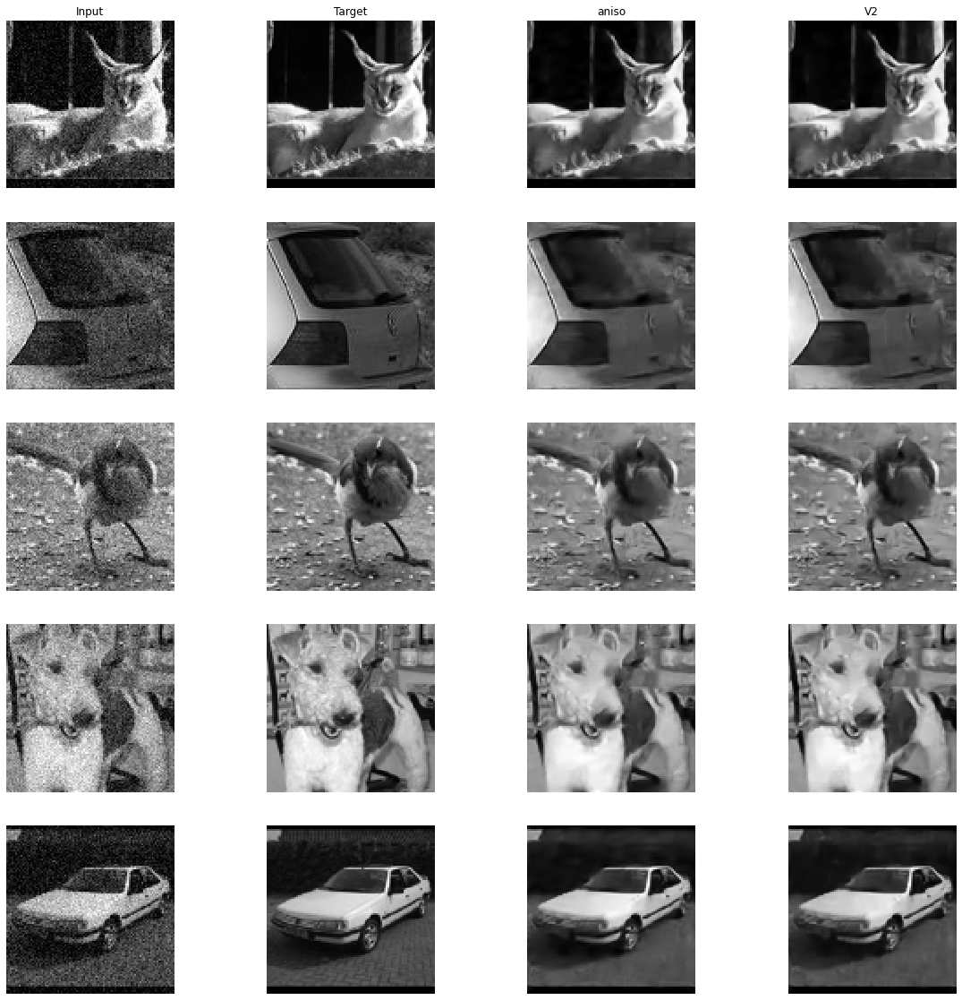

In [ ]:
for data in dataloader1:
  input,target = data
  input = input.to(device)
  noise_list = input.permute(0,2,3,1)
  target_list = target.to(device).permute(0,2,3,1)
  aniso_output = aniso_diffNet(input).permute(0,2,3,1)
  V2_output = V2_diffNet(input).permute(0,2,3,1)

input_plot = [ el.cpu().detach().squeeze().numpy() for el in noise_list]
imgs_plot = [ el.cpu().squeeze().numpy() for el in target_list]
aniso_plot = [ el.cpu().detach().squeeze().numpy() for el in aniso_output]
V2_plot = [ el.cpu().detach().squeeze().numpy() for el in V2_output]

img = [input_plot, imgs_plot, aniso_plot, V2_plot]
title = ['Input', 'Target', 'aniso', 'V2']
plot_images(img, title, None)
plt.show()
plt.close()

save images

In [ ]:
os.makedirs('results/aniso/output', exist_ok=True)
for i,img in enumerate(input_plot):
  save_image(torch.tensor(img), 'results/aniso/output/test_noise_{}.png'.format(i))
  save_image(torch.tensor(imgs_plot[i]), 'results/aniso/output/test_target_{}.png'.format(i))
  save_image(torch.tensor(aniso_plot[i]), 'results/aniso/output/test_aniso_{}.png'.format(i))


In [ ]:
os.makedirs('results/aniso/zip', exist_ok=True)
shutil.make_archive('results/aniso/zip/aniso_output', 'zip', 'results/aniso/output')

### Activation - phi

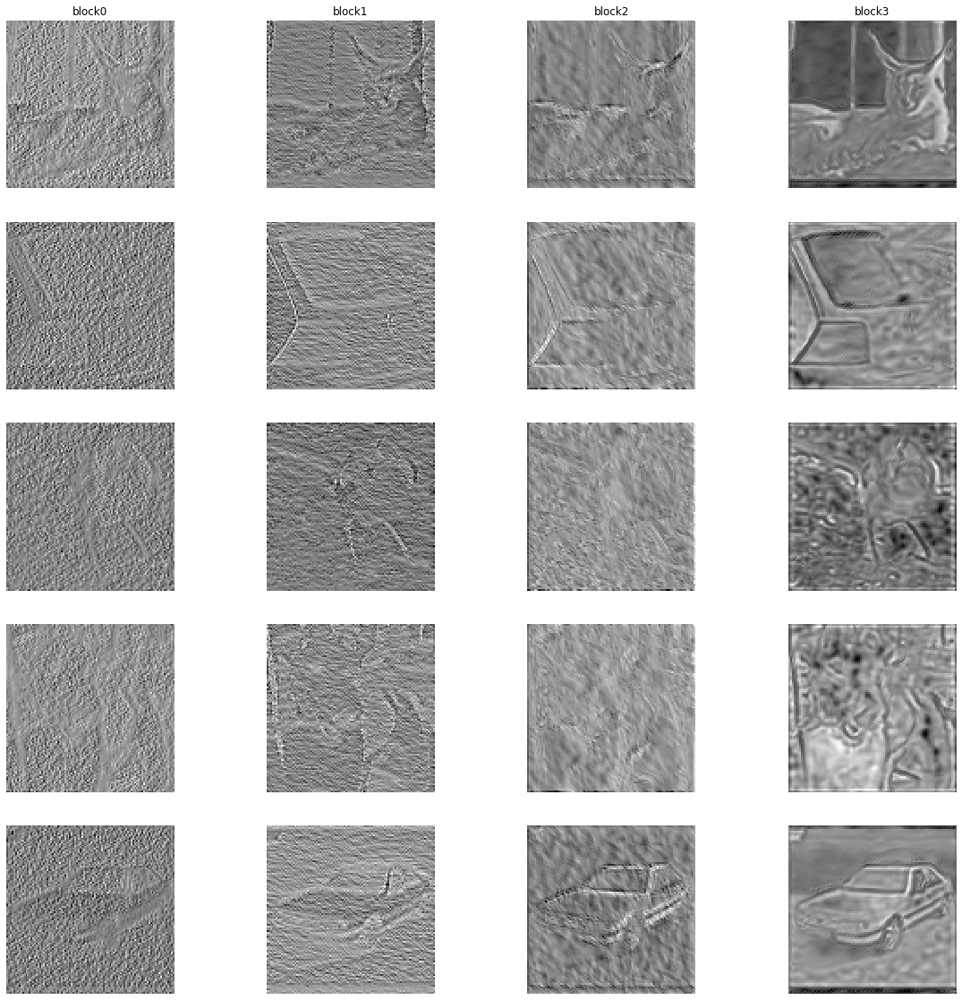

In [ ]:
phi = []
phi.append(aniso_diffNet.block1.activation)
phi.append(aniso_diffNet.block2.activation)
phi.append(aniso_diffNet.block3.activation)
phi.append(aniso_diffNet.block4.activation)
plot_hidden_output(phi, 'aniso', 'phi','train', False)

In [ ]:
shutil.make_archive('results/aniso/zip/aniso_phi', 'zip', 'results/aniso/phi')

'/content/results/aniso/zip/aniso_phi.zip'

### kappa

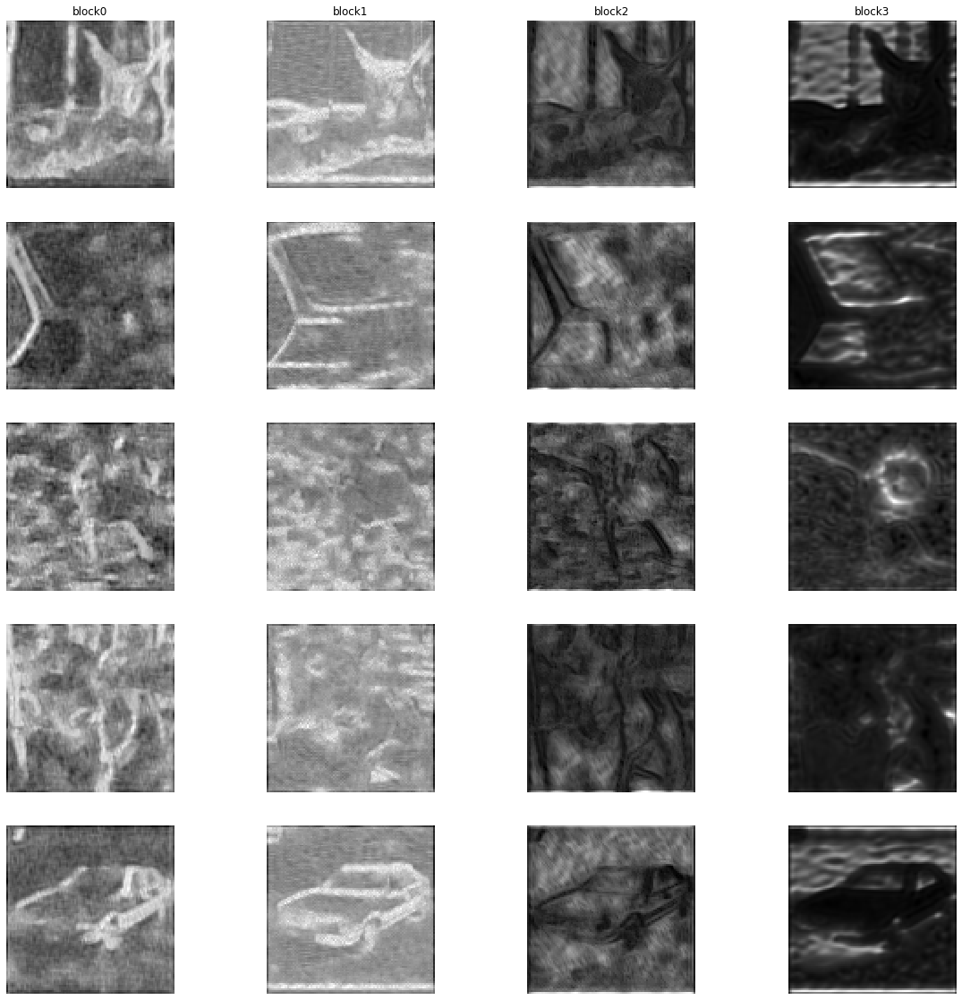

In [ ]:
# kfilter

kfilter = []
kfilter.append(aniso_diffNet.block1.kfilter)
kfilter.append(aniso_diffNet.block2.kfilter)
kfilter.append(aniso_diffNet.block3.kfilter)
kfilter.append(aniso_diffNet.block4.kfilter)
plot_hidden_output(kfilter, 'aniso', 'kfilter', False)

In [ ]:
shutil.make_archive('results/aniso/zip/aniso_kfilter', 'zip', 'results/aniso/kfilter')

'/content/results/aniso/zip/aniso_kfilter.zip'

### Divergence

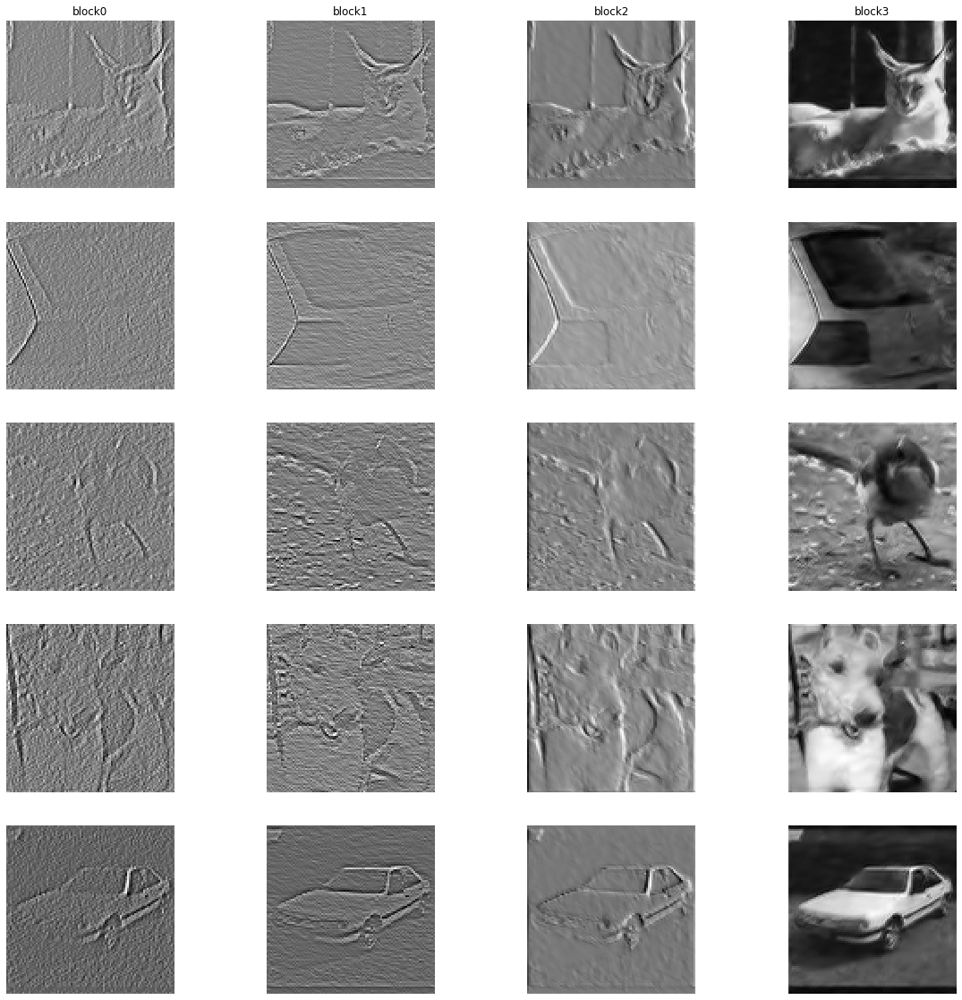

In [ ]:
# self.div - divergence

div = []
div.append(aniso_diffNet.block1.div)
div.append(aniso_diffNet.block2.div)
div.append(aniso_diffNet.block3.div)
div.append(aniso_diffNet.block4.div)
plot_hidden_output(div, 'aniso', 'div', False)

In [ ]:
shutil.make_archive('results/aniso/zip/aniso_div', 'zip', 'results/aniso/div')

'/content/results/aniso/zip/aniso_div.zip'

In [ ]:
div_images = []
trans = transforms.ToTensor()
for i in range(4):
  image = Image.open('results/aniso/div/test_div{}_0.png'.format(i)).convert('L')
  image = trans(image)-0.5
  div_images.append(image[:,:24,:24])
  print(div_images[i])


tensor([[[-0.0490, -0.0294, -0.0020, -0.0412, -0.0529, -0.0216,  0.1118,
          -0.0882, -0.1000, -0.0451, -0.0137, -0.0059, -0.0412, -0.1000,
           0.0569, -0.0451, -0.0529, -0.0098, -0.0137, -0.0608, -0.0137,
          -0.0216,  0.0294, -0.0765],
         [-0.0412, -0.0294,  0.0373, -0.0725, -0.0725, -0.0020, -0.0490,
          -0.1196, -0.0451,  0.0490,  0.0020, -0.1118, -0.0725,  0.0373,
           0.0529, -0.1431, -0.0137, -0.0176, -0.0647,  0.0098, -0.1000,
           0.0882, -0.0725, -0.0451],
         [-0.0608, -0.0333, -0.1039, -0.0725, -0.0216, -0.0608, -0.0098,
           0.0255, -0.0686, -0.0216, -0.0765, -0.0255, -0.0843,  0.1157,
          -0.1275, -0.0765, -0.0647, -0.0137, -0.0137,  0.0412, -0.1039,
          -0.0608, -0.1078,  0.0451],
         [-0.0804,  0.0098, -0.1275,  0.0333,  0.0686, -0.1588,  0.0961,
          -0.1392, -0.0294,  0.0451, -0.1275, -0.0647, -0.0373, -0.0137,
          -0.1157,  0.0137, -0.1118,  0.0137,  0.0137, -0.0922, -0.0843,
          

### Block Output

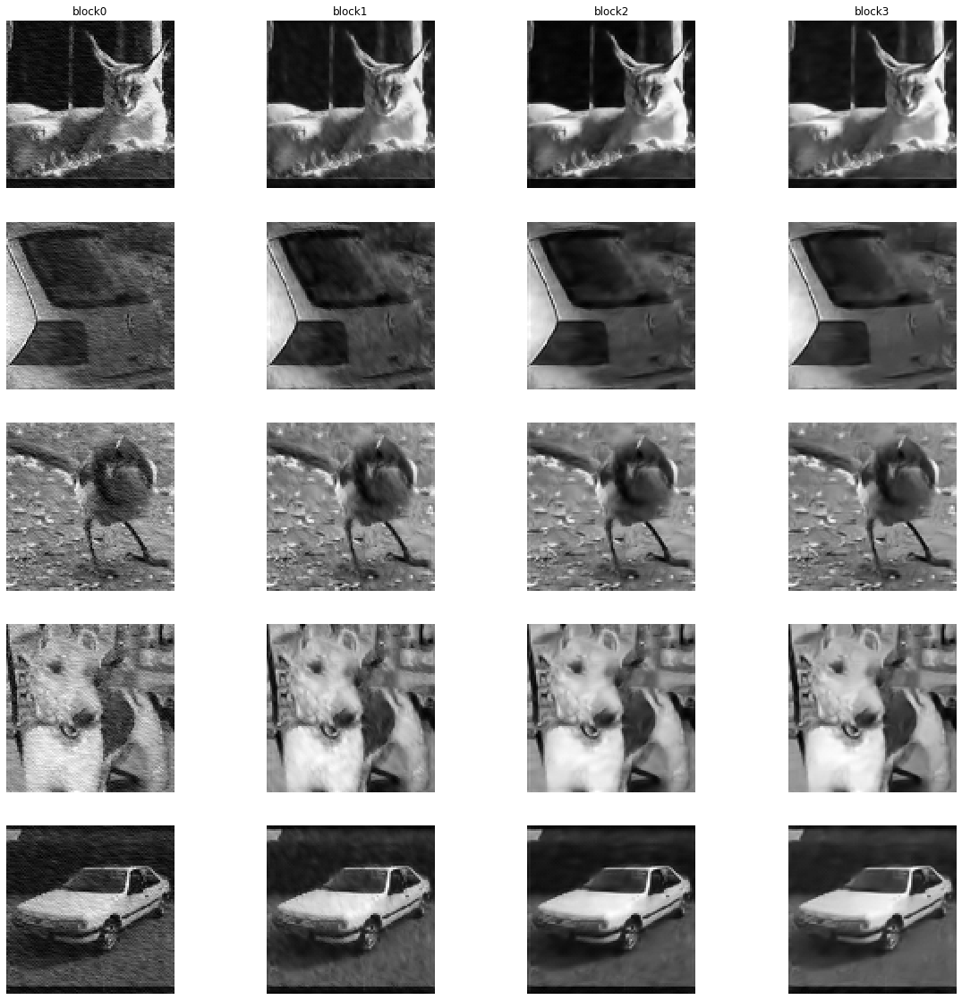

In [ ]:
# self.diff_image - output of the block

out = []
out.append(aniso_diffNet.block1.diff_image)
out.append(aniso_diffNet.block2.diff_image)
out.append(aniso_diffNet.block3.diff_image)
out.append(aniso_diffNet.block4.diff_image)
plot_hidden_output(out, 'aniso', 'out', False)

In [ ]:
shutil.make_archive('results/aniso/zip/aniso_out', 'zip', 'results/aniso/out')

'/content/results/aniso/zip/aniso_out.zip'

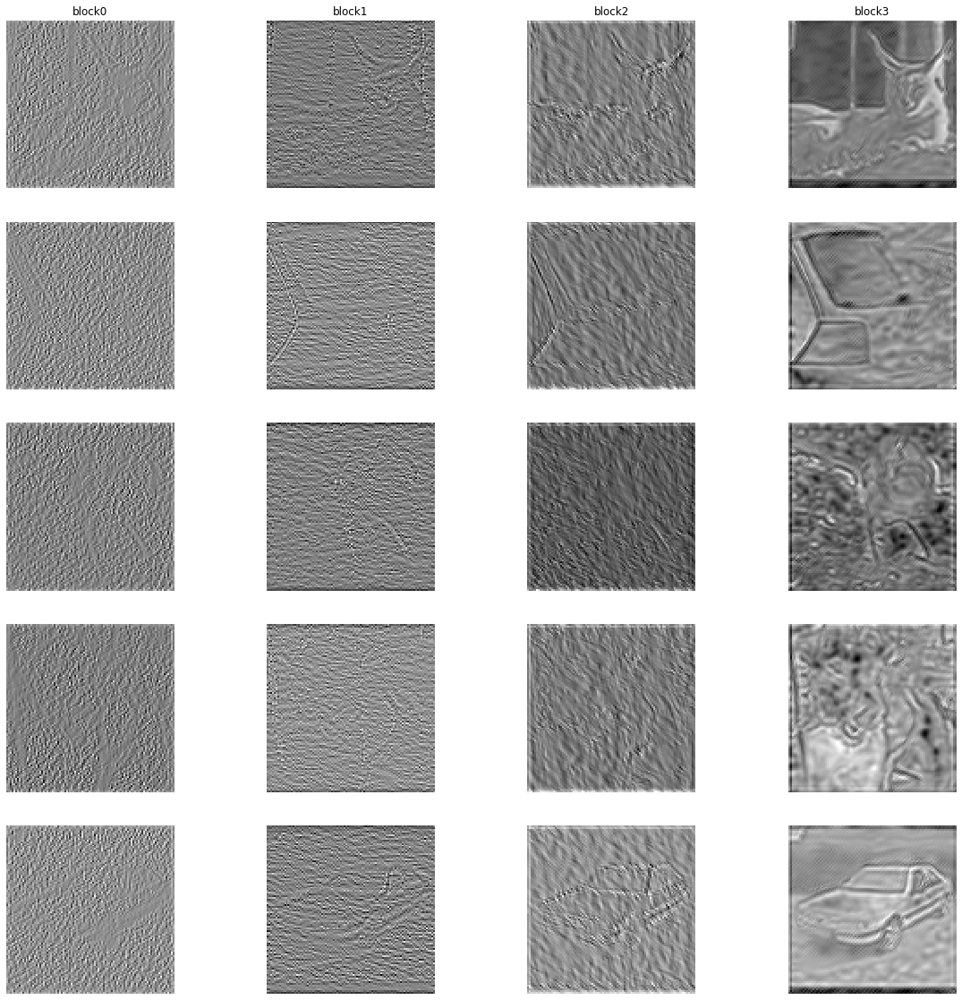

In [ ]:
difference = []
difference.append(aniso_diffNet.block1.difference)
difference.append(aniso_diffNet.block2.difference)
difference.append(aniso_diffNet.block3.difference)
difference.append(aniso_diffNet.block4.difference)
plot_hidden_output(difference, 'aniso', 'difference', False)

###Models Comparison

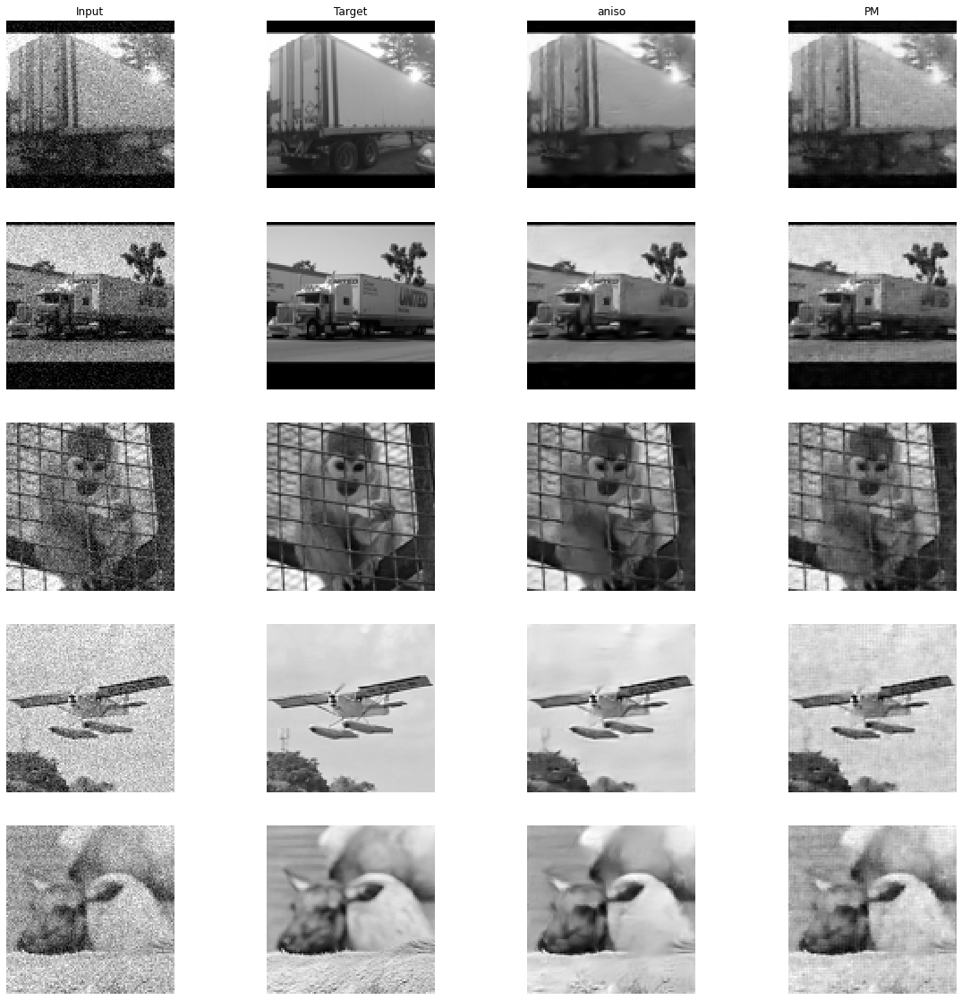

In [ ]:
img = [input_plot, imgs_plot, aniso_plot, PM_plot]
title = ['Input', 'Target', 'aniso', 'PM']
plot_images(img, title, None)
plt.show()
plt.close()

Save images

In [ ]:
os.makedirs('results/output', exist_ok=True)
for i,img in enumerate(input_plot):
  save_image(torch.tensor(img), 'results/output/test_noise_{}.png'.format(i))
  save_image(torch.tensor(imgs_plot[i]), 'results/output/test_target_{}.png'.format(i))
  save_image(torch.tensor(aniso_plot[i]), 'results/output/test_aniso_{}.png'.format(i))
  save_image(torch.tensor(PM_plot[i]), 'results/output/test_PM_{}.png'.format(i))

In [ ]:
shutil.make_archive('results/output', 'zip', 'results/output')

'/content/results/output.zip'

## Models Test (Gray)

In [ ]:
cur_diffNet = torch.load('models/Diffusion_PM.pth')
aniso_diffNet = torch.load('models/Diffusion.pth')

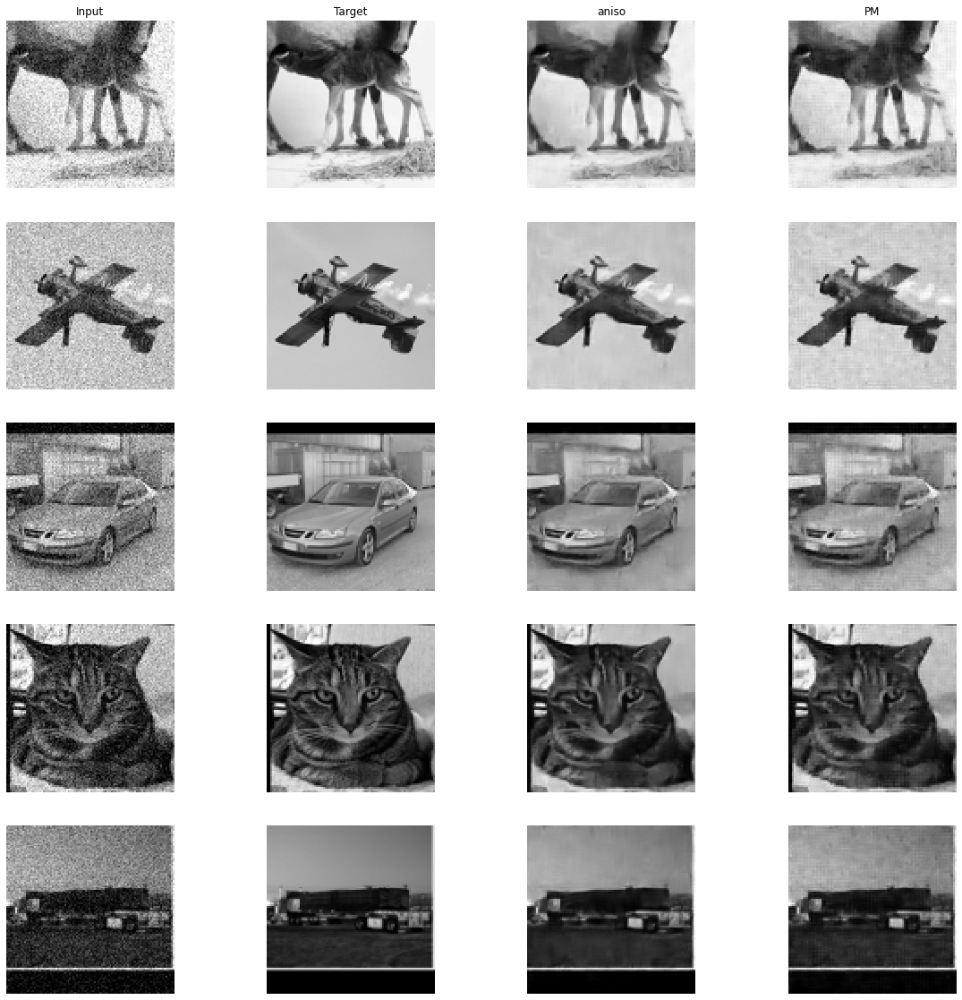

In [ ]:
indices = np.random.choice(range(len(Gray_test_dataset)), 5, replace=False)
#indices = np.random.choice(range(len(Diff_train_dataset)), 5, replace=False)
random_images = [Gray_test_dataset[idx] for idx in indices]

aniso_output = []
PM_output = []
target_list = []
input_list = []
dataloader = DataLoader(random_images)

for data in dataloader:
  input,target = data
  input = input.to(device)
  input_list.append(input.permute(0,2,3,1))
  target_list.append(target.to(device).permute(0,2,3,1))
  aniso_output.append(aniso_diffNet(input).permute(0,2,3,1))
  PM_output.append(cur_diffNet(input).permute(0,2,3,1))
  #res_output.append(resNet(input).permute(0,2,3,1))

input_plot = [ el.cpu().detach().squeeze().numpy() for el in input_list]
imgs_plot = [ el.cpu().squeeze().numpy() for el in target_list]
aniso_plot = [ el.cpu().detach().squeeze().numpy() for el in aniso_output]
PM_plot = [ el.cpu().detach().squeeze().numpy() for el in PM_output]


img = [input_plot, imgs_plot, aniso_plot, PM_plot]
title = ['Input', 'Target', 'aniso', 'PM']
plot_images(img, title, None)
plt.show()
plt.close()

save results

In [ ]:
os.makedirs('results', exist_ok=True)

In [ ]:
os.makedirs('results/2', exist_ok=True)
for i,img in enumerate(input_plot):
  save_image(torch.tensor(img), 'results/2/test_noise_{}.png'.format(i))
  save_image(torch.tensor(imgs_plot[i]), 'results/2/test_target_{}.png'.format(i))
  save_image(torch.tensor(PM_plot[i]), 'results/2/test_PM_{}.png'.format(i))
  save_image(torch.tensor(aniso_plot[i]), 'results/2/test_aniso_{}.png'.format(i))

In [ ]:
shutil.make_archive('result_2', 'zip', 'results/2')

'/content/result_2.zip'

## Models Train data test(Gray)

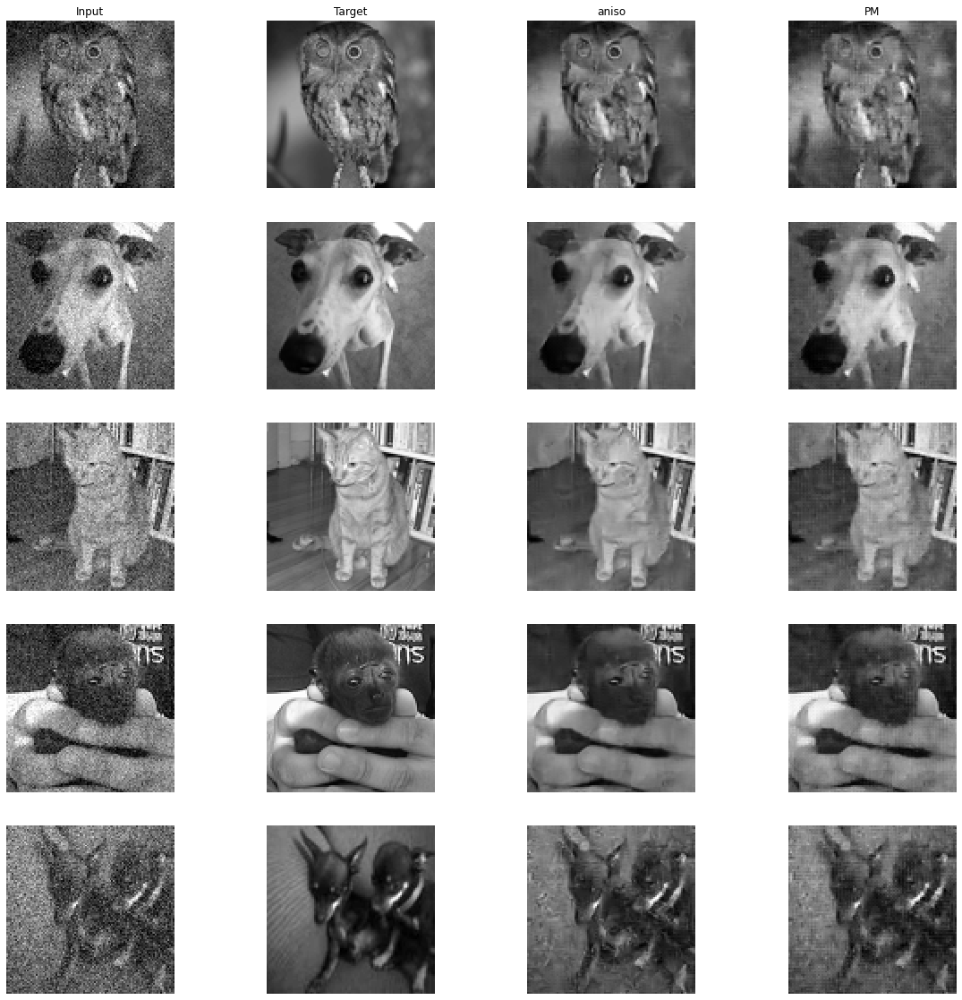

In [ ]:
indices = np.random.choice(range(len(Gray_train_dataset)), 5, replace=False)
#indices = np.random.choice(range(len(Diff_train_dataset)), 5, replace=False)
random_images = [Gray_train_dataset[idx] for idx in indices]

aniso_output = []
PM_output = []
target_list = []
input_list = []
dataloader = DataLoader(random_images)

for data in dataloader:
  input,target = data
  input = input.to(device)
  input_list.append(input.permute(0,2,3,1))
  target_list.append(target.to(device).permute(0,2,3,1))
  aniso_output.append(aniso_diffNet(input).permute(0,2,3,1))
  PM_output.append(cur_diffNet(input).permute(0,2,3,1))
  #res_output.append(resNet(input).permute(0,2,3,1))

input_plot = [ el.cpu().detach().squeeze().numpy() for el in input_list]
imgs_plot = [ el.cpu().squeeze().numpy() for el in target_list]
aniso_plot = [ el.cpu().detach().squeeze().numpy() for el in aniso_output]
PM_plot = [ el.cpu().detach().squeeze().numpy() for el in PM_output]


img = [input_plot, imgs_plot, aniso_plot, PM_plot]
title = ['Input', 'Target', 'aniso', 'PM']
plot_images(img, title, None)
plt.show()
plt.close()

In [ ]:
os.makedirs('results/2_train', exist_ok=True)
for i,img in enumerate(input_plot):
  save_image(torch.tensor(img), 'results/2_train/train_noise_{}.png'.format(i))
  save_image(torch.tensor(imgs_plot[i]), 'results/2_train/train_target_{}.png'.format(i))
  save_image(torch.tensor(PM_plot[i]), 'results/2_train/train_PM_{}.png'.format(i))
  save_image(torch.tensor(aniso_plot[i]), 'results/2_train/train_aniso_{}.png'.format(i))

In [ ]:
shutil.make_archive('train_2', 'zip', 'results/2_train')

'/content/train_2.zip'

## Create Dataset (Done)

In [ ]:
import scipy.sparse as sparse
import scipy.sparse.linalg as linalg

In [ ]:
class ADopts:
    def __init__(self, ADtype, ADkapfunc = None, ADiter = 1, ADdeltaT = 1, ADsolver = 'Explicit', ADthresh = None, ADK = None):
        self.ADtype = ADtype
        self.ADkapfunc = ADkapfunc
        self.ADiter = ADiter
        self.ADdeltaT = ADdeltaT
        self.ADsolver = ADsolver
        self.ADthresh = ADthresh
        self.ADK = ADK
        
class BALopts:
    def __init__(self, Verbose = False, thresh = None):
        self.Verbose = Verbose
        self.thresh = thresh

In [ ]:
def BuildAnisoLaplacian(im,kapfunc,N,options):
    n1 = N
    n2 = N
    oneN = torch.ones(N+1,1)
    
    diag = torch.reshape(torch.cat((oneN,-oneN),0), (2,-1))
    D1x = sparse.spdiags(diag,[-1,0],N+1,N)
    D2x = -D1x.T*D1x
        
    intdiag = torch.reshape(torch.cat((0.5*oneN,0.5*oneN),0), (2,-1))
    intx1d = sparse.spdiags(intdiag,[-1,0],N+1,N)
    
    D1x2d = sparse.kron(sparse.eye(N),D1x)
    D1y2d = sparse.kron(D1x,sparse.eye(N))
    intx2d = sparse.kron(sparse.eye(N),intx1d)
    inty2d = sparse.kron(intx1d,sparse.eye(N))
    
    h = torch.reshape(torch.t(im),(-1,1))
    gx1d = torch.tensor(D1x2d*h)
    gx2d = torch.t(torch.reshape(gx1d,(n1,n2+1)))
    gy1d = torch.tensor(D1y2d*h)
    gy2d = torch.t(torch.reshape(gy1d,(n1+1,n2)))
    gim = np.sqrt(gx2d[:n1,:]**2 + gy2d[:,:n2]**2)
    
    # we can get an alternative gradient image using interpolation operators.
    #gg1d = torch.sqrt(torch.tensor((intx2d.T*gx1d)**2 + (inty2d.T*gy1d)**2))
    #gg2d = torch.reshape(torch.t(gg1d),(n1,n2))
    
    kap2d = kapfunc(gim,options.thresh)
    if options.Verbose:
        print('N = {}'.format(N))
        nk1,nk2 = kap2d.shape
        print('Nk1={}'.format(nk1),' Nk2={}'.format(nk2)) 
    
    kap1d = torch.reshape(torch.t(kap2d),(-1,1))
    kap1x = sparse.spdiags((intx2d*kap1d).T,[0],(n1+1)*n2,(n1+1)*n2)
    kap1y = sparse.spdiags((inty2d*kap1d).T,[0],n1*(n2+1),n1*(n2+1))
    aLap = -(D1x2d.T*kap1x*D1x2d + D1y2d.T*kap1y*D1y2d)
    

    return aLap,gim,kap2d

In [ ]:
def AnisoDiff2d(im, N, options):
    
    # 1. set options and/or default options
    #im = im.double()
    
    if options.ADsolver != None:
        ADsolver = options.ADsolver
    else:
        ADsolver = 'Explicit'

    if options.ADiter != None:
        ADiter = options.ADiter
    else:
        ADiter = 1


    if options.ADdeltaT != None:
        ADdeltaT = options.ADdeltaT
    else:
        ADdeltaT = 1

    if options.ADtype != None:
        ADtype = options.ADtype
    else:
        ADtype = 'Iso'

        
    # 2. create a few useful matrix operators - laplacian
    
    n1=96
    n2=96

    N = n1 # assume square.
    oneN = torch.ones((N+1,1))
    #Dx = sparse.spdiags(N-1,N)
    diag = torch.reshape(torch.cat((-oneN,oneN),0), (2,-1))
    D1x = sparse.spdiags(diag,[-1,0],N+1,N)
    
    D2x = -D1x.T*D1x
    # The following allows interpolation to pixel mid-points;
    intdiag = torch.reshape(torch.cat((0.5*oneN,0.5*oneN),0), (2,-1))
    intx1d = sparse.spdiags(intdiag,[-1,0],N+1,N)

    # this form of the Laplacian (D2x) implicitly assumes Dirichlet b.c.s of
    # zero on the domain outside the interval [1-N]. I.e. f(0) = f(N+1) = 0

    D1x2d = sparse.kron(sparse.eye(N),D1x)
    D1y2d = sparse.kron(D1x,sparse.eye(N))
    intx2d = sparse.kron(sparse.eye(N),intx1d)
    inty2d = sparse.kron(intx1d,sparse.eye(N))

    Lapl = -(D1x2d.T*D1x2d + D1y2d.T*D1y2d)    
    
    # 3. include the image regularisation functionals.
    
    if options.ADthresh != None:
        ADthresh = options.ADthresh
    else:
        gx,gy = torch.gradient(im)
        gim = torch.sqrt(gx**2 + gy**2)
        gmax = torch.max(gim)
        ADthresh = 0.1*gmax
        
    kapTK1 = lambda s,T : torch.ones(s.shape)
    #kapTV =  lambda s,T : 1/s
    #kapsTV = lambda s,T : T/torch.sqrt(s**2 + T**2)
    #kapPM1 = lambda s,T : (T**2)/(s**2 + T**2)
    
    # 4. perform the diffusion
    
    img_out = im
    nt = ADiter
    total_time = ADiter
    img_history = torch.zeros(N,N,nt)
    k_history = torch.zeros(N,N,nt)
    gim_history = torch.zeros(N,N,nt)
    kapim_history = torch.zeros(N,N,nt)

    Klap = sparse.eye(N*N)
    BAL_opts = BALopts(Verbose=False,thresh=ADthresh)
    #print("BAL_opts thresh = {}".format(BAL_opts.thresh))



    if ADtype == 'EdgeWeighted':
        if options.ADkapfunc != None:
            kapfunc = options.ADkapfunc
        else:
            print('Diffusivity function not supplied in Options.kapfunc. Revert to isotropic')
            kapfunc = kapTK1
        Klap,gim,kapim = BuildAnisoLaplacian(im,kapfunc,N,BAL_opts)
        Klap = Klap
        h = torch.reshape(im.T,(-1,1))
        if ADsolver == 'Implicit':
            AA = sparse.eye(N*N) - ADdeltaT * Klap
            AA = AA.T
            for k in range(0,ADiter):
                #print('k = {}'.format(k))
                h = linalg.spsolve(AA,h)
                h = torch.tensor(h)
                img_history[:,:,k] = torch.reshape(h,(N,N)).T
        elif ADsolver == 'Explicit':
            AA = sparse.eye(N*N) + ADdeltaT * Klap
            AA = AA.T
            for k in range(0,ADiter):
                h = AA*h
                h = torch.tensor(h)
                img_history[:,:,k] = torch.reshape(h,(N,N)).T
        elif ADsolver == 'SemiImplicit':
            print('solver ',ADsolver,' not implemented yet')
        else:
            print('Unknown solver method ',ADsolver)
        img_out = torch.reshape(h,(N,N)).T

    elif ADtype == 'NonLinear':
        if options.ADkapfunc != None:
            kapfunc = options.ADkapfunc
        else:
            print('Diffusivity function not supplied in Options.kapfunc. Revert to isotropic')
            kapfunc = kapTK1
        h = torch.reshape(im.T,(-1,1))
        if ADsolver == 'Implicit':
            for k in range(0,ADiter):
                Klap,gim,kapim = BuildAnisoLaplacian(torch.reshape(h,(N,N)).T,kapfunc,N,BAL_opts)
                AA = sparse.eye(N*N) - ADdeltaT * Klap
                AA = AA.T
                h = linalg.spsolve(AA,h)
                h = torch.tensor(h)
                img_history[:,:,k] = torch.reshape(h,(N,N)).T

                diag = torch.tensor(-Klap.diagonal())
                kap_out_nonLinear = torch.reshape(diag/4, (N,N)).T

                k_history[:,:,k] = kap_out_nonLinear
        elif ADsolver == 'Explicit':
            for k in range(0,ADiter):
                Klap,gim,kapim = BuildAnisoLaplacian(torch.reshape(h,(N,N)).T,kapfunc,N,BAL_opts)
                AA = sparse.eye(N*N) + ADdeltaT * Klap
                AA = AA.T
                h = AA*h
                h = torch.tensor(h)
                img_history[:,:,k] = torch.reshape(h,(N,N)).T
        elif ADsolver == 'SemiImplicit':
            print('solver ',ADsolver,' not implemented yet')
        else:
            print('Unknown solver method ',ADsolver)
        img_out = torch.reshape(h,(N,N)).T
    
    else:
        print('Unknown diffusion type ', ADtype)
        

    
    return img_out, Klap, total_time, img_history, k_history

In [ ]:
def img_diff(im, N):
    # im = im/torch.max(im)
    # k_iso = lambda s, T : torch.ones(N,N)

    # iso_ADopts = ADopts('EdgeWeighted')
    # iso_ADopts.ADiter = 4
    # iso_ADopts.ADdeltaT = 0.1 # with this time step, implicit solver is needed
    # iso_ADopts.ADkapfunc =  k_iso
    # iso_ADopts.ADsolver = 'Implicit' # implicit is stable, but a bit slow, because inverse of matrix is needed

    # img_out_iso, K_iso, total_time_iso, img_history_iso = AnisoDiff2d(im, N, iso_ADopts)

    kapPM1 = lambda s, T : (T**2)/(s**2 + T**2)

    nonLinear_ADopts = ADopts('NonLinear') # changed
    nonLinear_ADopts.ADiter = 1
    nonLinear_ADopts.ADdeltaT = 1
    nonLinear_ADopts.ADsolver = 'Implicit'
    nonLinear_ADopts.ADkapfunc =  kapPM1
    nonLinear_ADopts.ADthresh = 0.04

    img_out_nonLinear, K_nonLinear, total_time_nonLinear, img_history_nonLinear, k_history = AnisoDiff2d(im, N, nonLinear_ADopts)

    diag = torch.tensor(-K_nonLinear.diagonal())
    kap_out_nonLinear = torch.reshape(diag/4, (N,N)).T

        
    return img_out_nonLinear, kap_out_nonLinear, img_history_nonLinear, k_history


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:121: UserWarning: The use of `x.T` on tensors of dimension other than 2 to reverse their shape is deprecated and it will throw an error in a future release. Consider `x.mT` to transpose batches of matricesor `x.permute(*torch.arange(x.ndim - 1, -1, -1))` to reverse the dimensions of a tensor. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2318.)


TypeError: ignored

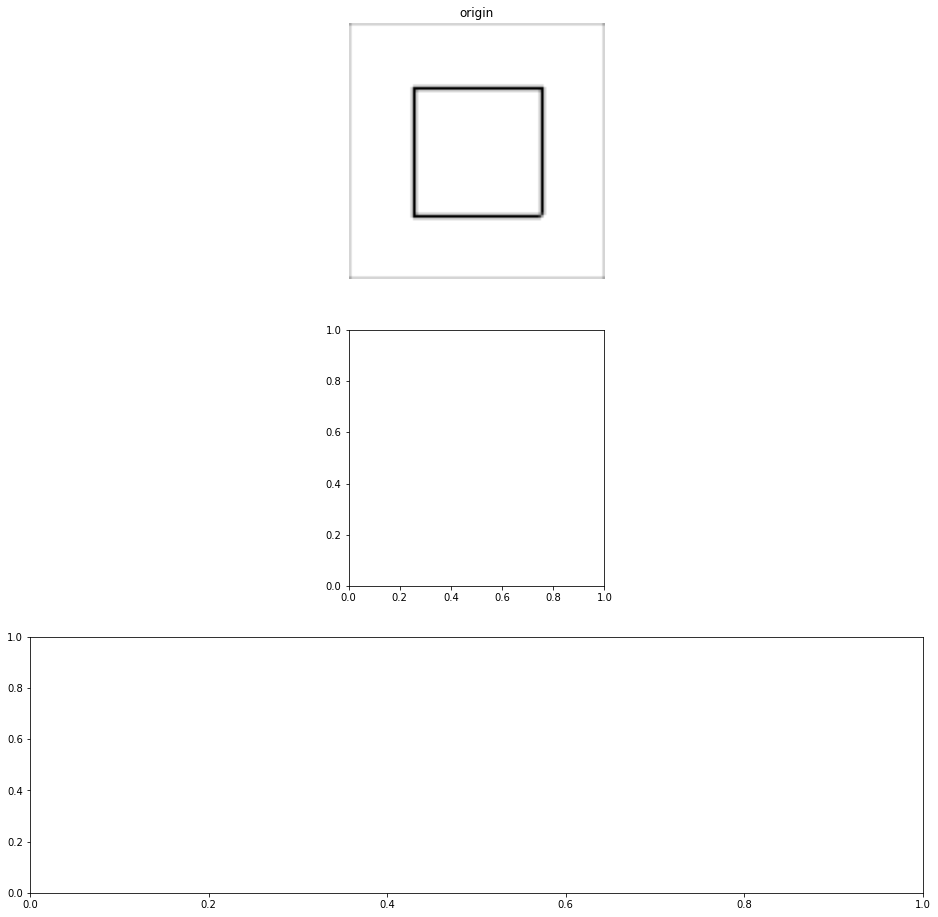

In [ ]:
image, k, _ , k_history= img_diff(rect1, 96)
#img_sobel = sobel * np.array(k_history[:,:,0])

f, ax = plt.subplots(3,1,figsize = (16,16))
ax[0].imshow(k, cmap = "gray")
ax[0].axis('off')
ax[0].set_title("origin")

ax[1].imshow(rect1, cmap = "gray")
ax[1].axis('off')
ax[1].set_title("origin")

ax[2].imshow(k_history[0,:,:], cmap = "gray")
ax[2].axis('off')
ax[2].set_title("origin")





In [ ]:
save_image(torch.tensor(k), 'results/grad/K.png', normalize=True)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  """Entry point for launching an IPython kernel.


In [ ]:
save_image(k_history[:,:,0].clone().detach(), 'results/grad/K.png', normalize=True)

### diffusion

In [ ]:
def diffuse(images):
    # images -> one batch, 8 images
    diffused_img = torch.ones(images.shape)
    k = torch.ones(images.shape)
    for i in range(len(images)):
        diffused_img[i], k[i], _ = img_diff(images[i], 96)

    return diffused_img,k
        


In [ ]:
PM_image, noise_image, origin_image = Gray_train_dataset[35]
img_out, kappa, history = img_diff(origin_image, 96)


In [ ]:
print(history.shape)

torch.Size([96, 96, 4])


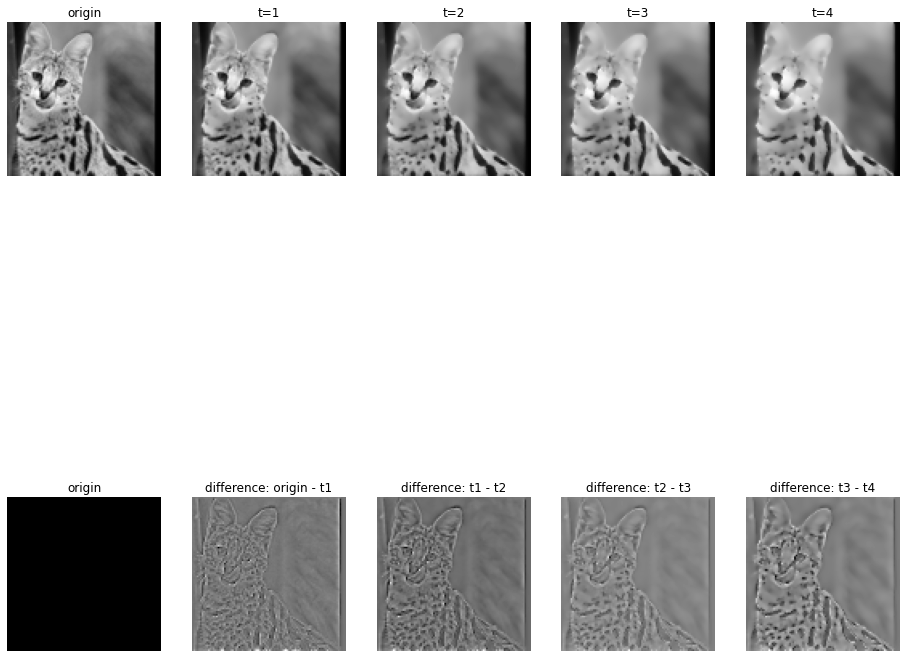

In [ ]:
image = origin_image.permute(1,2,0).squeeze()
f, ax = plt.subplots(2,5,figsize = (16,16))
ax[0,0].imshow(image, cmap = "gray")
ax[0,0].axis('off')
ax[0,0].set_title("origin")

ax[1,0].imshow(image-image, cmap = "gray")
ax[1,0].axis('off')
ax[1,0].set_title("origin")

ax[0,1].imshow(history[:,:,0], cmap = "gray")
ax[0,1].axis('off')
ax[0,1].set_title("t=1")

ax[1,1].imshow(image - history[:,:,0], cmap = "gray")
ax[1,1].axis('off')
ax[1,1].set_title("difference: origin - t1")

ax[0,2].imshow(history[:,:,1], cmap = "gray")
ax[0,2].axis('off')
ax[0,2].set_title("t=2")

ax[1,2].imshow(history[:,:,0] - history[:,:,1], cmap = "gray")
ax[1,2].axis('off')
ax[1,2].set_title("difference: t1 - t2")

ax[0,3].imshow(history[:,:,2], cmap = "gray")
ax[0,3].axis('off')
ax[0,3].set_title("t=3")

ax[1,3].imshow(history[:,:,1] - history[:,:,2], cmap = "gray")
ax[1,3].axis('off')
ax[1,3].set_title("difference: t2 - t3")

ax[0,4].imshow(history[:,:,3], cmap = "gray")
ax[0,4].axis('off')
ax[0,4].set_title("t=4")

ax[1,4].imshow(history[:,:,2] - history[:,:,3], cmap = "gray")
ax[1,4].axis('off')
ax[1,4].set_title("difference: t3 - t4")

#ax[1,1].axis('off')
plt.show()

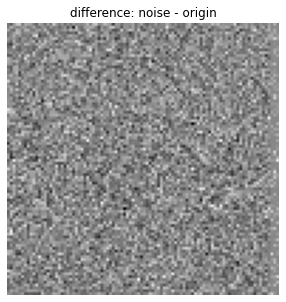

In [ ]:
PM_image, noise_image, origin_image = Gray_train_dataset[35]

difference = noise_image - origin_image

difference = difference.permute(1,2,0).squeeze()

f, ax = plt.subplots(1,1,figsize = (5,5))
ax.imshow(difference, cmap = "gray")
ax.set_title('difference: noise - origin')
ax.axis('off')
plt.show()


In [ ]:
transform = transforms.Compose([
     transforms.Grayscale(),
     transforms.ToTensor(),
])
train_data = STL10('./data', split='train', transform= transform, download=True)
test_data = STL10('./data', split='test', transform= transform, download=True)

part_train, res = torch.utils.data.random_split(train_data, [300,len(train_data)-300])
part_test,_ = torch.utils.data.random_split(test_data, [300, len(test_data)-300])

batch_size = 8 # generate name
train_loader = DataLoader(part_train, batch_size=batch_size)
test_loader = DataLoader(part_test, batch_size=batch_size)
singleDiff_len = len(train_data)

print('')
print('Number of training images: {}'.format(len(part_train)))
print('Number of test images: {}'.format(len(part_test)))

  0%|          | 0/2640397119 [00:00<?, ?it/s]

Extracting ./data/stl10_binary.tar.gz to ./data
Files already downloaded and verified

Number of training images: 300
Number of test images: 300


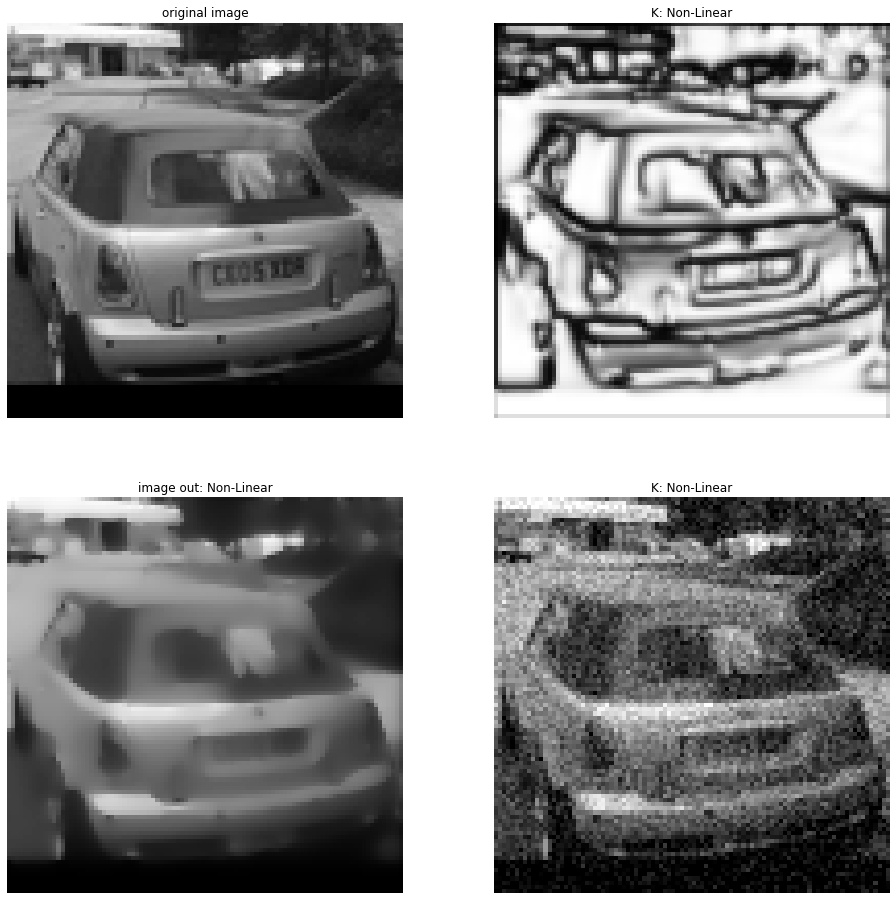

In [ ]:
for batch_num, data in enumerate(test_loader):
    #for batch_num, data in enumerate(train_loader):
        img, _ = data
        img = img.squeeze()
        gauss_img, k = diffuse(img)
        noise_img = torch.tensor(random_noise(img, mode='gaussian', mean=0, var=0.005, clip=True))
        #gauss_img = array(gauss_img).convert('L')
        # plt.figure(figsize=(15,15))
        # plt.subplot(3,1,1)
        # plt.imshow(gauss_img[5], cmap="gray")
        # plt.axis('off')

        f, ax = plt.subplots(2,2,figsize = (16,16))
        ax[0,0].imshow(img[5], cmap = "gray")
        ax[0,0].axis('off')
        ax[0,0].set_title("original image")
        ax[1,0].imshow(gauss_img[5], cmap = "gray")
        ax[1,0].axis('off')
        ax[1,0].set_title("image out: Non-Linear")
        ax[0,1].imshow(k[5], cmap = "gray")
        ax[0,1].axis('off')
        ax[0,1].set_title("K: Non-Linear")
        ax[1,1].imshow(noise_img[5], cmap = "gray")
        ax[1,1].axis('off')
        ax[1,1].set_title("K: Non-Linear")
        
        #ax[1,1].axis('off')
        plt.show()

        break

In [ ]:
# test Gaussian
os.makedirs('data/test_noise__', exist_ok=True)
def gaussian_noise():
    for batch_num, data in enumerate(test_loader):
    #for batch_num, data in enumerate(train_loader):
        img, _ = data
        gauss_img = torch.tensor(random_noise(img.squeeze(), mode='gaussian', mean=0, var=0.005, clip=True))
        diff_img,_ = diffuse(gauss_img.squeeze())
        #img = img.squeeze()
        for i in range(diff_img.size(0)):
          index = batch_num * 8 + i
          #save_image(gauss_img[i, :, :, :], 'data/gaussian_noise/gaussian_{}.png'.format(index))
          save_image(diff_img[i, :, :], 'data/test_noise__/test_noise_{}.png'.format(index))
          
        

gaussian_noise()

In [ ]:
# test Gaussian zip
import shutil

shutil.make_archive('test_noise', 'zip', 'data/test_noise__')
#shutil.make_archive('data/gaussian_noise', 'zip', 'data/gaussian_noise')

'/content/test_noise.zip'

In [ ]:
# train Gaussian
os.makedirs('data/train_noise_', exist_ok=True)
def gaussian_noise():
    for batch_num, data in enumerate(train_loader):
        img, _ = data
        #gauss_img = torch.tensor(random_noise(img.squeeze(), mode='gaussian', mean=0, var=0.005, clip=True))
        diffuse_img,_ = diffuse(img.squeeze())
        #img = img.squeeze()
        for i in range(diffuse_img.size(0)):
          index = batch_num * 8 + i
          save_image(diffuse_img[i, :, :], 'data/train_noise_/train_noise_{}.png'.format(index))

gaussian_noise()

In [ ]:
# train Gaussian zip
import shutil
shutil.make_archive('train_noise', 'zip', 'data/train_noise_')

'/content/train_noise.zip'

In [ ]:
# test origin
os.makedirs('train_img__', exist_ok=True)
#os.makedirs('img', exist_ok=True)
def pick_img():
    for batch_num, data in enumerate(train_loader):
    #for batch_num, data in enumerate(train_loader):
        img, _ = data
        for i in range(img.size(0)):
          index = batch_num * 8 + i
          save_image(img[i, :, :, :], 'train_img__/{}.png'.format(index))
          #save_image(img[i, :, :, :], 'img/{}.png'.format(index))

pick_img()

In [ ]:
shutil.make_archive('test_img__', 'zip', 'test_img__')
#shutil.make_archive('img', 'zip', 'img')

'/content/test_img__.zip'

### draw rectangle

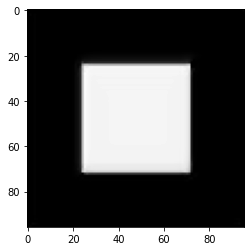

In [345]:
transform = torchvision.transforms.Grayscale()
rect1 = torch.ones((1,1,96,96))-1
rect1[0,0,24:72,24:72] = 1
#gauss_rect1 = torch.tensor(random_noise(rect1, mode='gaussian', mean=0, var=0.005, clip=True))

rect2 = torch.ones([1,1,96,96])*torch.rand(1)
#gauss_rect2 = torch.tensor(random_noise(rect2, mode='gaussian', mean=0, var=0.005, clip=True))
#print(gauss_rect)

# plt.imshow(rect1.squeeze(), cmap='gray')

PM_rect = PM_Net(rect1.to(device))

plt.imshow(PM_rect.squeeze().cpu().detach().numpy(), cmap='gray')

# print(gauss_rect)

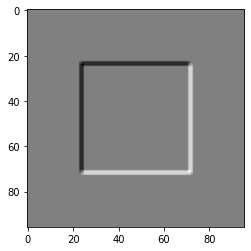

In [350]:
from scipy import ndimage





sx = ndimage.sobel(-rect1.squeeze(),axis=0,mode='constant')
sy = ndimage.sobel(-rect1.squeeze(),axis=1,mode='constant')
sobel=np.hypot(sx,sy)
comb = sx+sy


# for j, image in enumerate(grad):
#  save_image(torch.tensor(image), 'results/grad/1_{}.png'.format(j), normalize=True)

#shutil.make_archive('results/grad', 'zip', 'results/grad')

plt.imshow(sy+sx,cmap=plt.cm.gray)
plt.show()

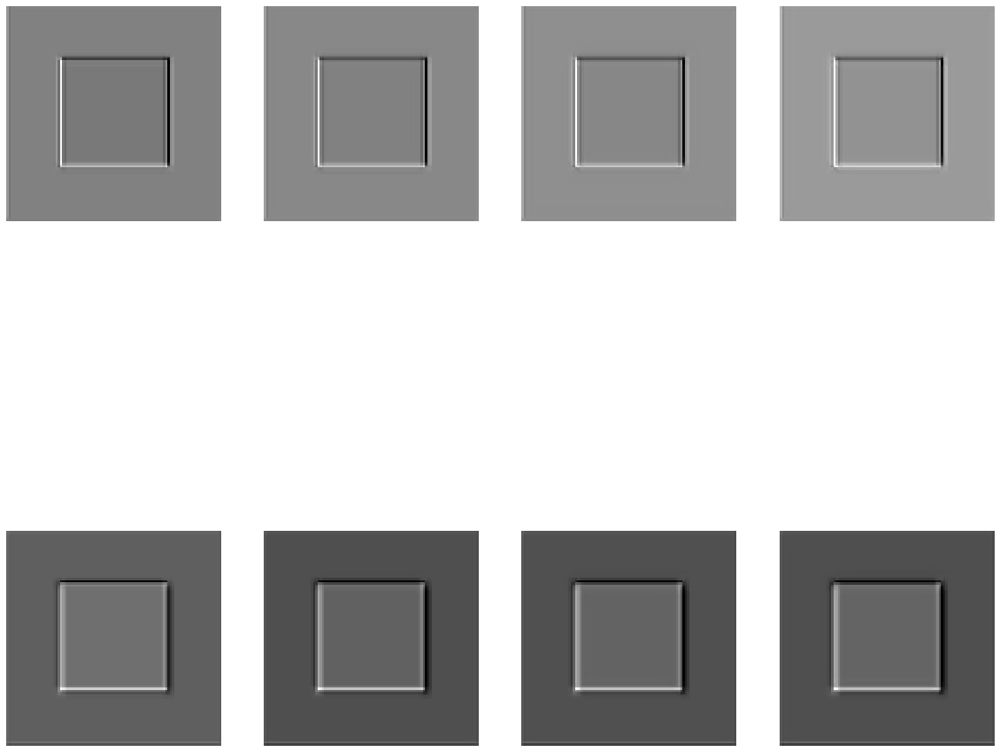

In [346]:
rect_List = []

# print(PM_Net.div1[:,0,:,:])
# print(PM_Net.div1[:,1,:,:])

rect_List.append(PM_Net.div1.reshape((2,1,96,96)).squeeze().cpu().detach().numpy())
rect_List.append(PM_Net.div2.reshape((2,1,96,96)).squeeze().cpu().detach().numpy())
rect_List.append(PM_Net.div3.reshape((2,1,96,96)).squeeze().cpu().detach().numpy())
rect_List.append(PM_Net.div4.reshape((2,1,96,96)).squeeze().cpu().detach().numpy())

# rect_List.append(PM_Net.div1)
# rect_List.append(PM_Net.div2)
# rect_List.append(PM_Net.div3)
# rect_List.append(PM_Net.div4)

# rect_List.append(PM_Net.div1[:,0,:,:] + PM_Net.div1[:,1,:,:])
# rect_List.append(PM_Net.div2[:,0,:,:] + PM_Net.div2[:,1,:,:])
# rect_List.append(PM_Net.div3[:,0,:,:] + PM_Net.div3[:,1,:,:])
# rect_List.append(PM_Net.div4[:,0,:,:] + PM_Net.div4[:,1,:,:])



# rect_List.append(PM_Net.kfilter1)
# rect_List.append(PM_Net.kfilter2)
# rect_List.append(PM_Net.kfilter3)
# rect_List.append(PM_Net.kfilter4)

plot_images(rect_List, None, None)



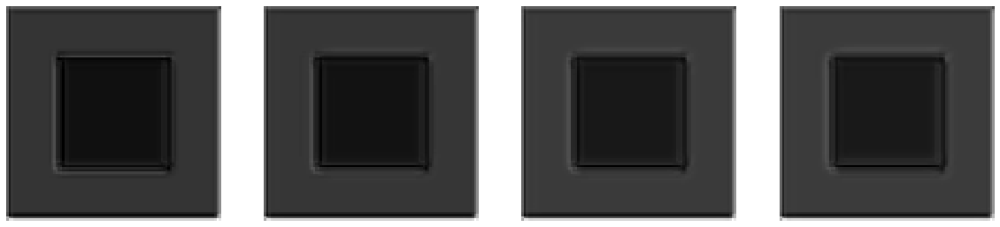

In [340]:
fig, axs = plt.subplots(1, 4)
fig.set_figwidth(20)
fig.set_figheight(20)

for i, img_col in enumerate(rect_List):
    for j, img in enumerate(img_col):
        # if len(img.shape) == 2:
        #     if 1 == 1:
        #       axs[j].imshow(img, interpolation='nearest', cmap='gray')
        #       continue
        #     axs[j,i].imshow(img, interpolation='nearest', cmap='gray')
        # else:
        axs[i].imshow(img.squeeze().cpu().detach().numpy(), interpolation='nearest', cmap='gray')
        axs[i].axis('off')
plt.show()


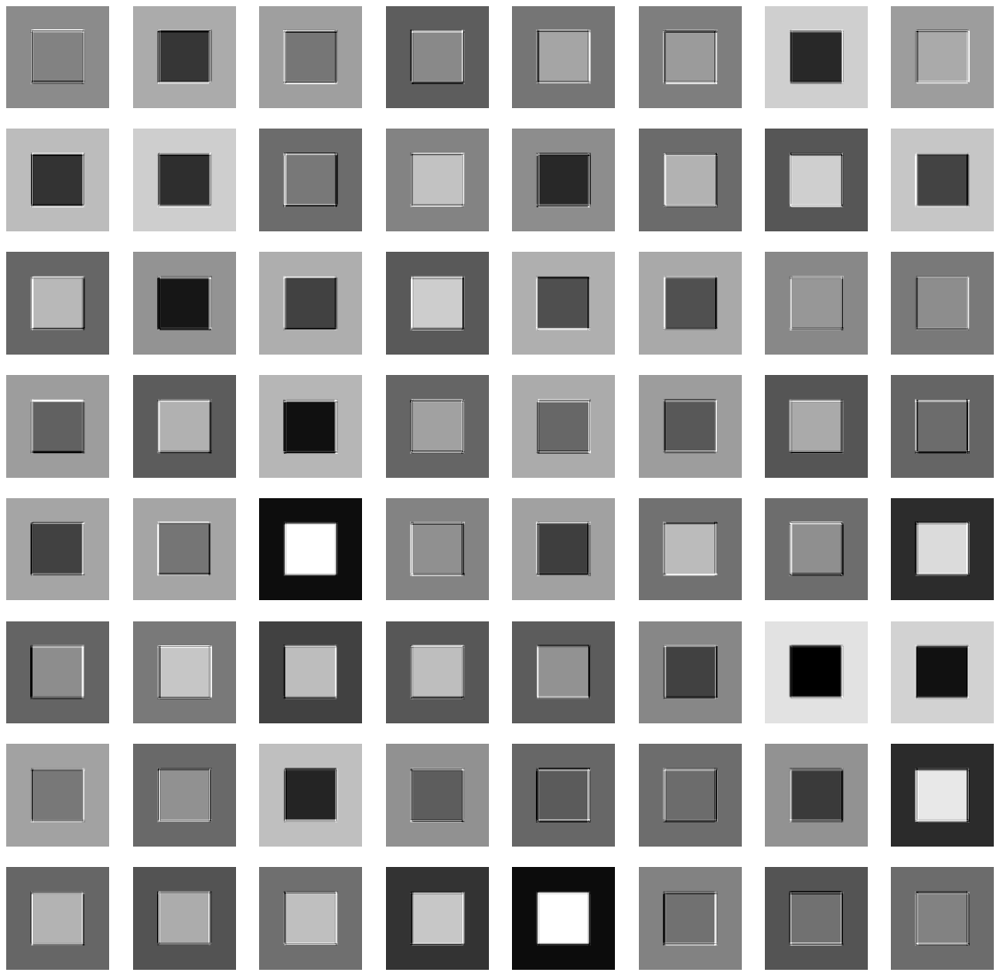

In [ ]:
div_filter1 = PM_Net.block.diff[0].weight.data
div_filter2 = PM_Net.block.diff[1].weight.data
filtered1 = F.conv2d(rect1.to(device), div_filter1,stride=1, padding=1)
# filtered1 = F.relu(filtered1)
filtered2 = F.conv2d(filtered1, div_filter2,stride=1, padding=1)
# filtered2 = F.relu(filtered2)

filtered_reshape = filtered2.reshape((8,8,96,96)).cpu()
plot_images(filtered_reshape, None,None)